In [4]:
# Use conda env "sam" for kernel
from pathlib import Path
import cv2
import numpy as np
import torch

%matplotlib inline
from matplotlib import pyplot as plt

## Load Original Image

In [5]:
gt_nomask_path = str(Path("images/cup-0011-gt.png"))
rendered_nomask_path = str(Path("images/step_500_10_pred_nomask.png"))
rendered_masked_path = str(Path("images/step_500_10_pred_masked.png"))

(1080, 1920, 3)


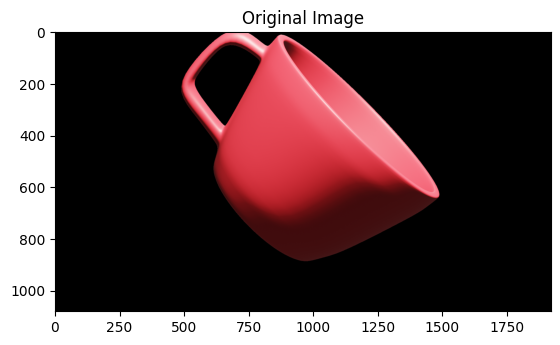

In [6]:
image = cv2.imread(gt_nomask_path)
print(image.shape)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.title('Original Image')
plt.imshow(image)
plt.show()

## Load SAM model

Using the smallest model checkpoint `vit-b`.

In [7]:
sam_checkpoint_path = str(Path("/home/keyan/code/SAM-Track/Segment-and-Track-Anything/ckpt/sam_vit_b_01ec64.pth"))

In [8]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = sam_checkpoint_path
model_type = "vit_b"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint) 
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(
    model=sam, # The SAM model used is loaded from the checkpoint file
    points_per_side=8, # Number of points to be sampled along one side of the image. Total number of points is this squared.
    min_mask_region_area=100,  # Requires open-cv to run post-processing; filter small disconnected regions and holes in masks the have smaller region than this value.
)

## Image Embeddings

Setting the image, GPU usage 3.5 Gi / 11 Gi.

In [9]:
# Set image for the predictor
mask_generator.predictor.set_image(image)

In [10]:
# Get image embeddings
image_embedding = mask_generator.predictor.features

In [11]:
# Image embedding can be viewed as a 64 x 64 256-dimensional "image"
# To visualize this "image", we need to use PCA to reduce the 256 dimensions to 3 dimensions and visualize as RGB.
print(image_embedding.shape)

torch.Size([1, 256, 64, 64])


In [12]:
# Moves the tensor from GPU to CPU and converts it to numpy array
image_embedding_cpu = image_embedding.squeeze().cpu().numpy()
print(image_embedding_cpu.shape)

(256, 64, 64)


Turn `image_embedding_cpu` from `(256, 64, 64)` to `(3, 64, 64)`.

Use PCA to reduce the first dimension from 256 to 3, abd use the 3 dimensions as RGB.

Use sklearn's PCA implementation: <https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html>.

- The input data is centered but not scaled for each feature before applying the SVD.


Remember to properly scale your data before applying PCA!

In [13]:
from sklearn.decomposition import PCA

In [14]:
from sklearn.preprocessing import StandardScaler

In [15]:
# We want to reduce the first dimension from 256 to 3, so reshape the original numpy array from (256, 64, 64) to (4096, 256)
# X: array-like of shape (n_samples, n_features)
# Training data, where "n_samples" is the number of samples and "n_features" is the number of features
training_data = image_embedding_cpu.reshape(256, 64*64).T # 4096 x 256
print(training_data.shape)

(4096, 256)


In [16]:
print(training_data)

[[-0.06199047 -0.00744378  0.02499183 ...  0.07492287  0.03171396
  -0.04039295]
 [-0.06692474 -0.06878337  0.05367129 ...  0.07793177  0.04518855
  -0.05316577]
 [-0.06936881 -0.06269532  0.05254674 ...  0.09596378  0.06204626
  -0.0484182 ]
 ...
 [ 0.00415091 -0.04709671  0.04209445 ... -0.06968328 -0.18155757
   0.02298291]
 [ 0.00436095 -0.04882292  0.04345585 ... -0.07974142 -0.17387149
   0.0229006 ]
 [-0.00388325 -0.06084144  0.03094898 ... -0.04722612 -0.20716777
   0.03641105]]


In [17]:
scaled_training_data = StandardScaler().fit_transform(training_data)
print(scaled_training_data.shape)

(4096, 256)


In [18]:
print(scaled_training_data)

[[-1.5696722   1.9986359  -1.0685066  ...  1.3418103   0.44568154
  -1.369961  ]
 [-1.7722423   0.69315845  0.5647229  ...  1.3970466   0.53924435
  -1.7504593 ]
 [-1.8725806   0.82272893  0.5006828  ...  1.7280709   0.65629834
  -1.6090307 ]
 ...
 [ 1.145679    1.154711   -0.09455133 ... -1.3128109  -1.0352007
   0.51798487]
 [ 1.1543018   1.1179724  -0.0170227  ... -1.4974542  -0.9818313
   0.51553303]
 [ 0.8158464   0.86218476 -0.7292607  ... -0.90055144 -1.213029
   0.9180049 ]]


In [19]:
# Number of components to keep = 3
n_components = 3
pca = PCA(n_components = n_components)

# Fit PCA on the reshaped training data
# fit(X, y=None)
# X: array-like of shape (n_samples, n_features)
# Training data, where n_samples is the number of samples and n_features is the number of features
pca.fit(scaled_training_data)

# Transform the data to reduce dimensionality
# Apply dimensionality reduction to X.
reduced_data = pca.transform(scaled_training_data)

print(reduced_data.shape)

(4096, 3)


(4096, 1)
(64, 64)


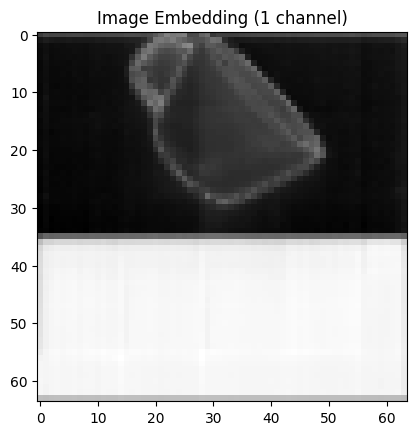

In [20]:
pca_2 = PCA(n_components = 1)
single_channel_reduced_data = pca_2.fit_transform(scaled_training_data)
print(single_channel_reduced_data.shape)
single_channel_img = single_channel_reduced_data.reshape(64, 64)
print(single_channel_img.shape)
# Visualize the tensor as a 64x64 image
plt.imshow(single_channel_img, cmap='gray')
plt.title('Image Embedding (1 channel)')
plt.show()

In [21]:
# Reshape the "reduced_data" for visualization
rgb_img = reduced_data.reshape(64, 64, 3)

In [22]:
# To make the cup look red, swap the R and G channels
grb_img = rgb_img.copy() 
grb_img[..., [0, 1]] = grb_img[..., [1, 0]]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


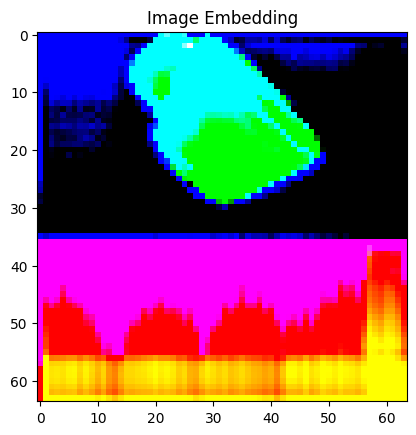

In [23]:
# Visualize the tensor as a 64x64 image
plt.imshow(rgb_img)
plt.title('Image Embedding')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


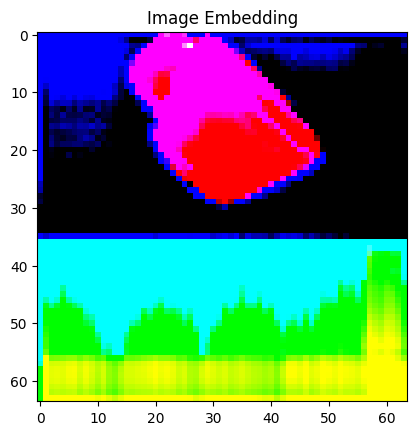

In [24]:
# Visualize the tensor as a 64x64 image
plt.imshow(grb_img)  # Adjust the cmap as needed
plt.title('Image Embedding')
plt.show()

## Prompt Embedding

We only have 64 points, which is exactly the size of 1 batch, so we only have 1 batch of 64 points.

oints, which is exactly the size of 1 batch, so we only have 1 batch of 64 points.

In [25]:
all_points = mask_generator.point_grids[0]
print(all_points.shape)

(64, 2)


In [26]:
print(all_points) # between [0, 1] x [0, 1]

[[0.0625 0.0625]
 [0.1875 0.0625]
 [0.3125 0.0625]
 [0.4375 0.0625]
 [0.5625 0.0625]
 [0.6875 0.0625]
 [0.8125 0.0625]
 [0.9375 0.0625]
 [0.0625 0.1875]
 [0.1875 0.1875]
 [0.3125 0.1875]
 [0.4375 0.1875]
 [0.5625 0.1875]
 [0.6875 0.1875]
 [0.8125 0.1875]
 [0.9375 0.1875]
 [0.0625 0.3125]
 [0.1875 0.3125]
 [0.3125 0.3125]
 [0.4375 0.3125]
 [0.5625 0.3125]
 [0.6875 0.3125]
 [0.8125 0.3125]
 [0.9375 0.3125]
 [0.0625 0.4375]
 [0.1875 0.4375]
 [0.3125 0.4375]
 [0.4375 0.4375]
 [0.5625 0.4375]
 [0.6875 0.4375]
 [0.8125 0.4375]
 [0.9375 0.4375]
 [0.0625 0.5625]
 [0.1875 0.5625]
 [0.3125 0.5625]
 [0.4375 0.5625]
 [0.5625 0.5625]
 [0.6875 0.5625]
 [0.8125 0.5625]
 [0.9375 0.5625]
 [0.0625 0.6875]
 [0.1875 0.6875]
 [0.3125 0.6875]
 [0.4375 0.6875]
 [0.5625 0.6875]
 [0.6875 0.6875]
 [0.8125 0.6875]
 [0.9375 0.6875]
 [0.0625 0.8125]
 [0.1875 0.8125]
 [0.3125 0.8125]
 [0.4375 0.8125]
 [0.5625 0.8125]
 [0.6875 0.8125]
 [0.8125 0.8125]
 [0.9375 0.8125]
 [0.0625 0.9375]
 [0.1875 0.9375]
 [0.3125 0.937

In [27]:
cropped_im_size = image.shape[:2]
points_scale = np.array(cropped_im_size)[None, ::-1]
points_for_image = all_points * points_scale

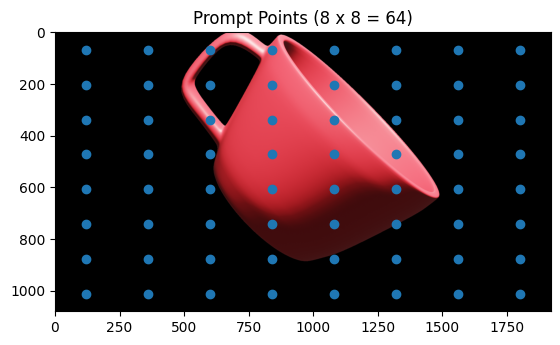

In [28]:
plt.scatter(points_for_image[:, 0], points_for_image[:, 1], marker="o")
plt.title('Prompt Points (8 x 8 = 64)')
plt.imshow(image)
plt.show()

In [29]:
im_size = points_for_image.shape[:2]
print(im_size)

(64, 2)


### Proccessing 1 batch (64 prompt points) below

From here below, we are proccesing a batch of prompt points. Since we only have 64 points, there is exactly 1 batch of 64 points.

In [30]:
transformed_points = mask_generator.predictor.transform.apply_coords(points_for_image, im_size)
in_points = torch.as_tensor(transformed_points, device=mask_generator.predictor.device) # batch_size x 2
in_labels = torch.ones(in_points.shape[0], dtype=torch.int, device=in_points.device) # batch_size x 1

print(in_points.shape)
print(in_labels.shape)

point_coords = in_points[:, None, :]
point_labels = in_labels[:, None]
print(point_coords.shape)
print(point_labels.shape)

points = (point_coords, point_labels)

torch.Size([64, 2])
torch.Size([64])
torch.Size([64, 1, 2])
torch.Size([64, 1])


Use prompt encoder to get the prompt embeddings (tokens)

In [31]:
sparse_embeddings, dense_embeddings = mask_generator.predictor.model.prompt_encoder(
            points=points,
            boxes=None,
            masks=None,
        )

In [32]:
print(sparse_embeddings.shape)
print(dense_embeddings.shape)

torch.Size([64, 2, 256])
torch.Size([64, 256, 64, 64])


We are only using the sparse prompts (points). The dense prompts are masks produced earlier, which is not used in our case. If dense prompt is not give, SAM produces a default dense prompt embbeding in `PromptEncoder.forward()`:

```python
dense_embeddings = self.no_mask_embed.weight.reshape(1, -1, 1, 1).expand(
                bs, -1, self.image_embedding_size[0], self.image_embedding_size[1]
            )
```

In [33]:
# All the dense embeddings should be equal along the first dimension, since it's expanded for the entire batch.
dense_embeddings[0, :, :, :] == dense_embeddings[1, :, :, :]

tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

        [[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

        [[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

Visualizing the dense embeddings

In [34]:
# Since for all the 64 prompt points within 1 batch, the dense embeddings are the same,
# we only take one of them to visualize.
dense_embedding_0 = dense_embeddings[0, :, :, :]
print(dense_embedding_0.shape)

torch.Size([256, 64, 64])


In [35]:
print(dense_embedding_0)

tensor([[[0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300],
         [0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300],
         [0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300],
         ...,
         [0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300],
         [0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300],
         [0.0300, 0.0300, 0.0300,  ..., 0.0300, 0.0300, 0.0300]],

        [[0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272],
         [0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272],
         [0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272],
         ...,
         [0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272],
         [0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272],
         [0.0272, 0.0272, 0.0272,  ..., 0.0272, 0.0272, 0.0272]],

        [[0.0295, 0.0295, 0.0295,  ..., 0.0295, 0.0295, 0.0295],
         [0.0295, 0.0295, 0.0295,  ..., 0.0295, 0.0295, 0.0295],
         [0.0295, 0.0295, 0.0295,  ..., 0.0295, 0.0295, 0.

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:640: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


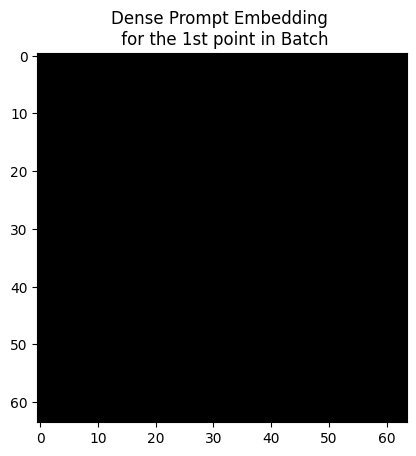

In [36]:
dense_prompt_embedding_0_cpu = dense_embedding_0.detach().cpu().numpy()
training_data_dense_prompt_embedding_0 = dense_prompt_embedding_0_cpu.reshape(256, 64*64).T # 4096 x 256
training_data_dense_prompt_embedding_0 = StandardScaler().fit_transform(training_data_dense_prompt_embedding_0)
dense_prompt_embedding_0_reduced_data = pca.fit_transform(training_data_dense_prompt_embedding_0)
rgb_dense_prompt_embedding_0 = dense_prompt_embedding_0_reduced_data.reshape(64, 64, 3)
plt.imshow(rgb_dense_prompt_embedding_0)
plt.title('Dense Prompt Embedding \n for the 1st point in Batch')
plt.show()

The `sparse_embeddings` has shape `(64, 2, 256)`.
* `64`: batch size, there are 64 prompt points in 1 batch
* `2`: foreground and background points
    * 0: foreground points
    * 1: background points
    * We are only using foreground points here
* `256`: 256 dimensions
    * To visualize, also use PCA to reduce 256-d to 3-d, and visualize as RGB

In [37]:
fg_points_embeddings = sparse_embeddings[:, 0, :]
print(fg_points_embeddings.shape)

bg_points_embeddings = sparse_embeddings[:, 1, :]
print(bg_points_embeddings.shape)

fg_points_embeddings_cpu = fg_points_embeddings.cpu().detach().numpy()
print(fg_points_embeddings_cpu.shape)

bg_points_embeddings_cpu = bg_points_embeddings.cpu().detach().numpy()
print(bg_points_embeddings_cpu.shape)

torch.Size([64, 256])
torch.Size([64, 256])
(64, 256)
(64, 256)


Using PCA to reduce 256-d to 3-d:

In [38]:
# X: array-like of shape (n_samples, n_features)
# Training data, where "n_samples" is the number of samples and "n_features" is the number of features
training_data_fg = fg_points_embeddings_cpu
training_data_fg = StandardScaler().fit_transform(training_data_fg)
print(training_data_fg.shape)

training_data_bg = bg_points_embeddings_cpu
training_data_bg = StandardScaler().fit_transform(training_data_bg)
print(training_data_bg.shape)

(64, 256)
(64, 256)


In [39]:
fg_reduced_data = pca.fit_transform(training_data_fg)
print(fg_reduced_data.shape)

bg_reduced_data = pca.fit_transform(training_data_bg)
print(bg_reduced_data.shape)

(64, 3)
(64, 3)


/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


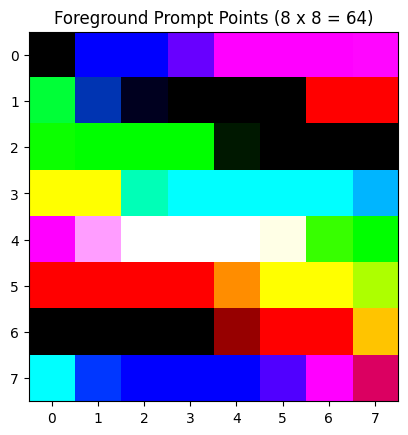

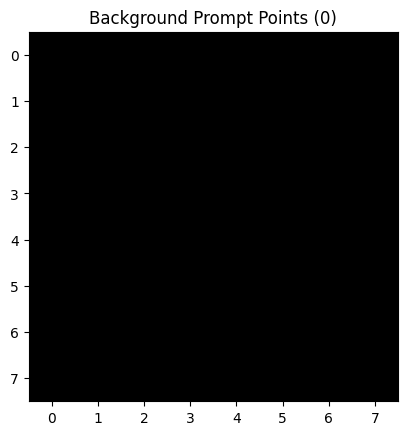

In [40]:
fg_img = fg_reduced_data.reshape(8, 8, 3)
plt.title('Foreground Prompt Points (8 x 8 = 64)')
plt.imshow(fg_img)
plt.show()

bg_img = bg_reduced_data.reshape(8, 8, 3)
plt.title('Background Prompt Points (0)')
plt.imshow(bg_img)
plt.show()

## Mask Decoder

Visualize stuff inside the `mask_generator.predictor.model.mask_decoder.predict_masks()` function.

Before the dot product that produces the masks:

* `upscaled_embedding`: image embedding gets updated, and then upscaled
* The mlp input and output:
    * input: `mask_tokens_out[:, i, :], i = 0, 1, 2, 3`
    * output: `self.output_hypernetworks_mlps[i](input)`

In [41]:
mask_decoder = mask_generator.predictor.model.mask_decoder

In [42]:
# Prepare inputs for Decoder Blocks:
# 1. Image embeddings 
image_embeddings = image_embedding
print("image embedding = ", image_embedding.shape)

# 2. Image Positional Encodings
image_pe=mask_generator.predictor.model.prompt_encoder.get_dense_pe()
print("image positional encoding = ", image_pe.shape)

# 3. Prompt Embeddings (sparse + dense)
sparse_prompt_embeddings = sparse_embeddings
dense_prompt_embeddings = dense_embeddings

print("sparse prompt embeddings = ", sparse_prompt_embeddings.shape)
print("dense prompt embeddings = ", dense_prompt_embeddings.shape)

image embedding =  torch.Size([1, 256, 64, 64])
image positional encoding =  torch.Size([1, 256, 64, 64])
sparse prompt embeddings =  torch.Size([64, 2, 256])
dense prompt embeddings =  torch.Size([64, 256, 64, 64])


Visualizing image positional encoding:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


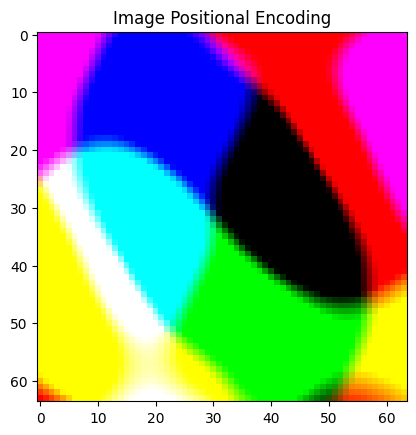

In [43]:
# Moves the tensor from GPU to CPU and converts it to numpy array
image_pe_cpu = image_pe.squeeze().cpu().numpy()
training_data_img_pe = image_pe_cpu.reshape(256, 64*64).T # 4096 x 256
training_data_img_pe = StandardScaler().fit_transform(training_data_img_pe)
img_pe_reduced_data = pca.fit_transform(training_data_img_pe)
rgb_img_pe = img_pe_reduced_data.reshape(64, 64, 3)
plt.imshow(rgb_img_pe)
plt.title('Image Positional Encoding')
plt.show()

In [44]:
# Code from `MaskDecoder.predict_masks()`

# Concatenate 1 iou token and 4 mask tokens (defined by MaskDecoder)
# 1. iou_token: [1, 256] for predicted IoU score
# 2. mask_tokens: [4, 256] for mask output
output_tokens = torch.cat([mask_decoder.iou_token.weight, mask_decoder.mask_tokens.weight], dim=0)
print(output_tokens.shape) # [5, 256]

# Expand tokens in batch direction (append first dimension, and copy 64 times along first dimension)
output_tokens = output_tokens.unsqueeze(0).expand(sparse_prompt_embeddings.size(0), -1, -1)
print(output_tokens.shape) # [64, 5, 256]

# Concatenate
# 1. iou_token: [:, 0, :] for predicted IoU score
# 2. mask_tokens: [:, 1:5, :] for mask output
# 3. sparse_prompt_embeddings: [:, 5:7, :] for the foreground and background prompt points
tokens = torch.cat((output_tokens, sparse_prompt_embeddings), dim=1)
print(tokens.shape)

torch.Size([5, 256])
torch.Size([64, 5, 256])
torch.Size([64, 7, 256])


Visualize all the 7 tokens.

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


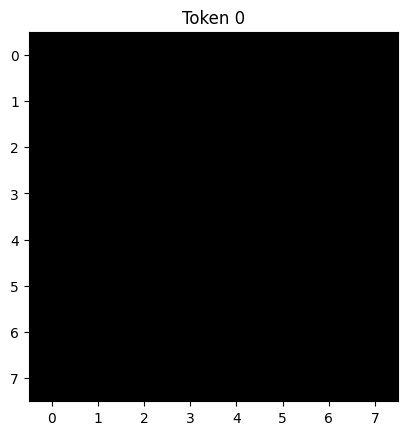

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


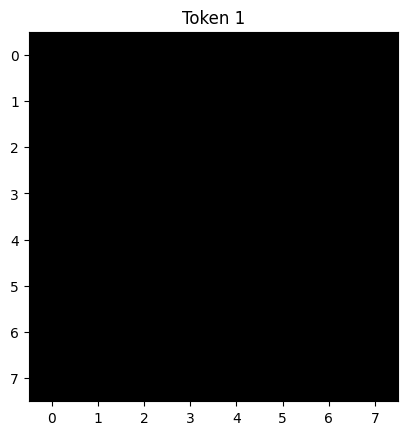

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


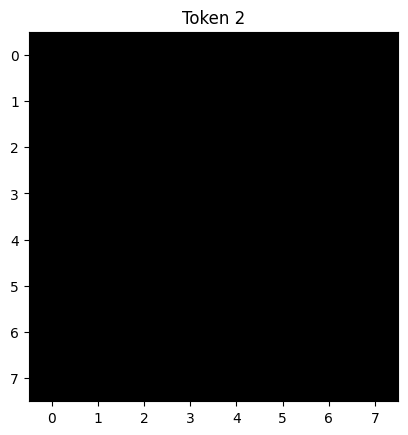

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


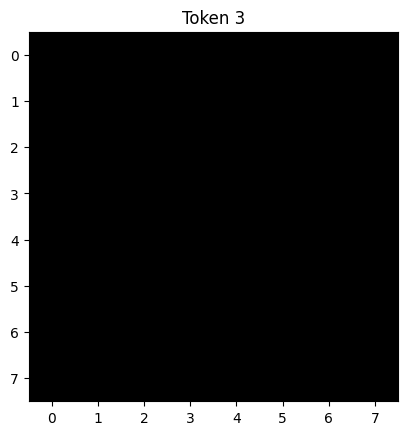

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


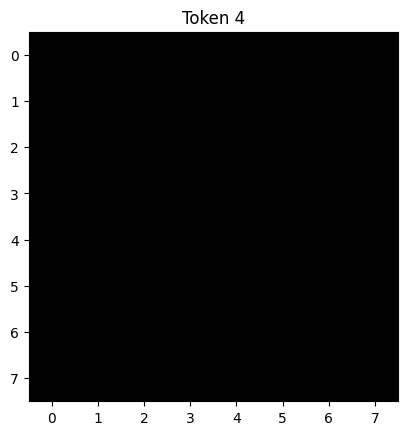

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


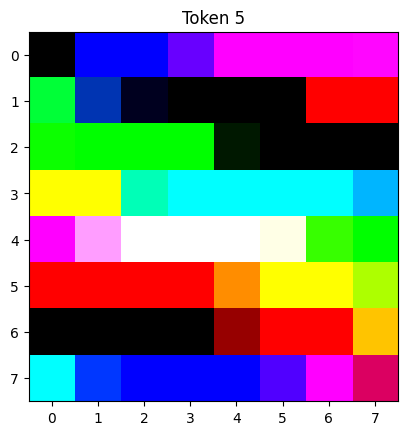

/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


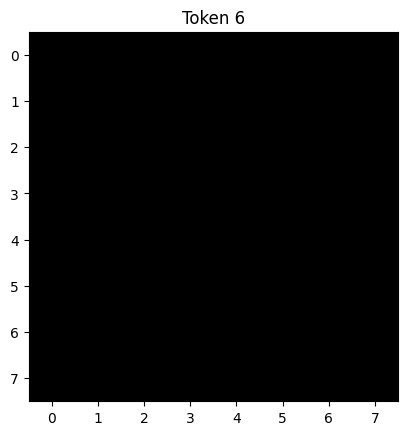

In [45]:
for i in range(7):
    token_i = tokens[:, i, :]
    token_i_cpu = token_i.cpu().detach().numpy()
    token_i_training_data = token_i_cpu
    token_i_training_data = StandardScaler().fit_transform(token_i_training_data)
    token_i_reduced_data = pca.fit_transform(token_i_training_data)
    token_i_img = token_i_reduced_data.reshape(8, 8, 3)
    plt.title('Token %d' % i)
    plt.imshow(token_i_img)
    plt.show()


/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/keyan/miniconda3/envs/sam/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:543: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


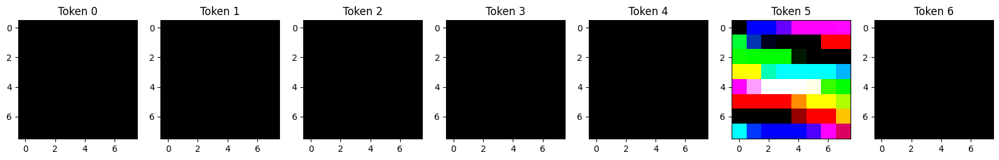

In [46]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    token_i = tokens[:, i, :]
    token_i_cpu = token_i.cpu().detach().numpy()
    token_i_training_data = token_i_cpu
    token_i_training_data = StandardScaler().fit_transform(token_i_training_data)
    token_i_reduced_data = pca.fit_transform(token_i_training_data)
    token_i_img = token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.title('Token %d' % i)
    plt.imshow(token_i_img)
plt.show()


In [47]:
print(image_embeddings.shape)
print(image_pe.shape)

torch.Size([1, 256, 64, 64])
torch.Size([1, 256, 64, 64])


In [48]:
# Expand image embedding in batch direction (copy along first dimension for 64 times)
src = torch.repeat_interleave(image_embeddings, tokens.shape[0], dim=0)
print(src.shape)

# Expand image positional encoding in batch direction (copy along first dimension for 64 times)
pos_src = torch.repeat_interleave(image_pe, tokens.shape[0], dim=0)
print(pos_src.shape)

torch.Size([64, 256, 64, 64])
torch.Size([64, 256, 64, 64])


In [49]:
# Add dense prompt embeddings
# We are not using prompt embeddings at all, this is adding some values though.
src = src + dense_prompt_embeddings

print(src.shape)

torch.Size([64, 256, 64, 64])


In [50]:
b, c, h, w = src.shape 
print(b, c, h, w)

64 256 64 64


Visualize image embedding again after adding dense prompt embeddings

In [51]:
# Along the first dimension of 64 prompt points in a batch, everything should be equal
src[0, :, :, :] == src[1, :, :, :]

tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

        [[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

        [[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]],

In [52]:
# Only visualize the first one (for the first prompt point)
src_0 = src[0, :, :, :]
print(src_0.shape)

torch.Size([256, 64, 64])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


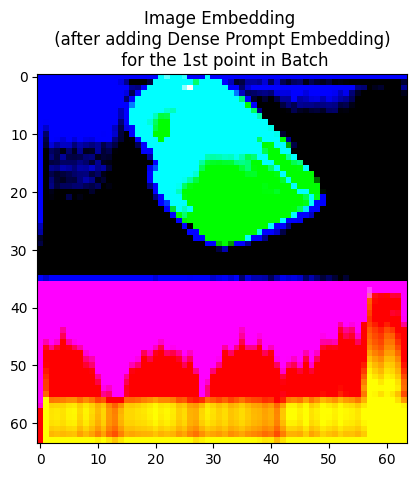

In [53]:
src_0_cpu = src_0.detach().cpu().numpy()
training_data_src_0 = src_0_cpu.reshape(256, 64*64).T # 4096 x 256
training_data_src_0 = StandardScaler().fit_transform(training_data_src_0)
src_0_reduced_data = pca.fit_transform(training_data_src_0)
rgb_src_0 = src_0_reduced_data.reshape(64, 64, 3)
plt.imshow(rgb_src_0)
plt.title('Image Embedding \n (after adding Dense Prompt Embedding) \n for the 1st point in Batch')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


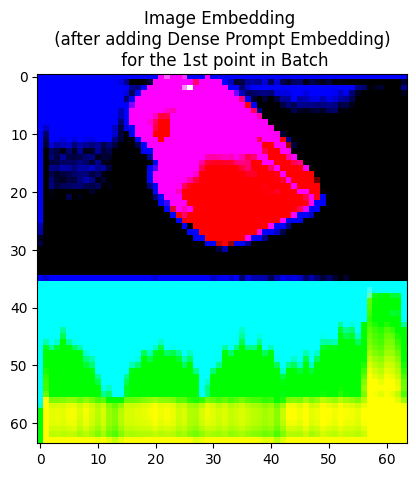

In [54]:
# To make the cup look red, swap the R and G channels
grb_src_0 = rgb_src_0.copy() 
grb_src_0[..., [0, 1]] = grb_src_0[..., [1, 0]]
plt.imshow(grb_src_0)
plt.title('Image Embedding \n (after adding Dense Prompt Embedding) \n for the 1st point in Batch')
plt.show()

## Run Transformer

Transformer is the 2 decoder blocks that do self-attention and cross-attention.

Image embedding and token embeddings are updated.

Running the transformer increases GPU usage from 3.5 Gi to 5.9 Gi / 11 Gi.

In [55]:
# Run the transformer
# The two decoder blocks that perform self attention and cross attention
# The image embeddings and tokens are updated.
# hs, src = mask_decoder.transformer(src, pos_src, tokens)

### Steps inside `transformer()`


```python
transformer=TwoWayTransformer(
                depth=2,
                embedding_dim=prompt_embed_dim, # 256
                mlp_dim=2048,
                num_heads=8,
            )
```

Look at `TwoWayTransformer.forward(image_embedding, image_pe, point_embedding)`.
* `image_embedding`: (64) x 256-d x (64 x 64)
* `image_pe`: (64) x 256-d x (64 x 64)
* `point_embedding`: (64) x 7 x (256-d)

In [56]:
decoder_transformer = mask_decoder.transformer

In [57]:
print(decoder_transformer)

TwoWayTransformer(
  (layers): ModuleList(
    (0-1): 2 x TwoWayAttentionBlock(
      (self_attn): Attention(
        (q_proj): Linear(in_features=256, out_features=256, bias=True)
        (k_proj): Linear(in_features=256, out_features=256, bias=True)
        (v_proj): Linear(in_features=256, out_features=256, bias=True)
        (out_proj): Linear(in_features=256, out_features=256, bias=True)
      )
      (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (cross_attn_token_to_image): Attention(
        (q_proj): Linear(in_features=256, out_features=128, bias=True)
        (k_proj): Linear(in_features=256, out_features=128, bias=True)
        (v_proj): Linear(in_features=256, out_features=128, bias=True)
        (out_proj): Linear(in_features=128, out_features=256, bias=True)
      )
      (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (mlp): MLPBlock(
        (lin1): Linear(in_features=256, out_features=2048, bias=True)
        (lin2): Linear(in

In [58]:
# For image embedding:
# 1. Flatten from dimension 2
# 2. Swap dimension 2 and dimension 1
image_embedding = src.flatten(2).permute(0, 2, 1)
print(src.shape)
print(src.flatten(2).shape)
print(image_embedding.shape)

torch.Size([64, 256, 64, 64])
torch.Size([64, 256, 4096])
torch.Size([64, 4096, 256])


In [59]:
# For image positional encoding (same operation):
# 1. Flatten from dimension 2
# 2. Swap dimension 2 and dimension 1
image_pe = pos_src.flatten(2).permute(0, 2, 1)
print(image_pe.shape)

torch.Size([64, 4096, 256])


In [60]:
point_embedding = tokens
print(point_embedding.shape)

torch.Size([64, 7, 256])


In [61]:
# Prepare queries, keys, values for self attention and cross attention

# Cross attention from (queries: tokens) to (keys, values: image embeddings)
# 1. queries: tokens
# 2. keys, values: image embeddings
queries = point_embedding # [64, 7, 256]
keys = image_embedding # [64, 4096, 256]


There are two attention blocks, each defined as:

```python
for i in range(depth):
            self.layers.append(
                TwoWayAttentionBlock(
                    embedding_dim=embedding_dim,
                    num_heads=num_heads,
                    mlp_dim=mlp_dim,
                    activation=activation,
                    attention_downsample_rate=attention_downsample_rate,
                    skip_first_layer_pe=(i == 0),
                )
            )
```

Look at `TwoWayAttentionBlock.forward()`.

In [62]:
# There are two attention blocks
first_attention_block = decoder_transformer.layers[0]
second_attention_block = decoder_transformer.layers[1]

print(first_attention_block.skip_first_layer_pe) # i = 0 (first attention block)
print(second_attention_block.skip_first_layer_pe) # 1 = 1 (second attention block)

True
False


#### First Decoder Block

Step by step visualization of 

```python
queries, keys = first_attention_block(
                queries=queries, # point_embedding = tokens [64, 7, 256], this will be updated for the second attention block
                keys=keys, # image_embedding [64, 4096, 256]
                query_pe=point_embedding, # point_embedding = tokens [64, 7, 256], this will not be updated for the second attention block
                key_pe=image_pe, # [64, 4096, 256]
            )
```

In [63]:
print(first_attention_block)

TwoWayAttentionBlock(
  (self_attn): Attention(
    (q_proj): Linear(in_features=256, out_features=256, bias=True)
    (k_proj): Linear(in_features=256, out_features=256, bias=True)
    (v_proj): Linear(in_features=256, out_features=256, bias=True)
    (out_proj): Linear(in_features=256, out_features=256, bias=True)
  )
  (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (cross_attn_token_to_image): Attention(
    (q_proj): Linear(in_features=256, out_features=128, bias=True)
    (k_proj): Linear(in_features=256, out_features=128, bias=True)
    (v_proj): Linear(in_features=256, out_features=128, bias=True)
    (out_proj): Linear(in_features=128, out_features=256, bias=True)
  )
  (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (mlp): MLPBlock(
    (lin1): Linear(in_features=256, out_features=2048, bias=True)
    (lin2): Linear(in_features=2048, out_features=256, bias=True)
    (act): ReLU()
  )
  (norm3): LayerNorm((256,), eps=1e-05, elementwise_affine=

In [64]:
print(first_attention_block.skip_first_layer_pe) # i = 0 (first attention block) should be True

True


In [65]:
queries = queries # point_embedding
keys = keys # image_embedding
query_pe = point_embedding
key_pe = image_pe

##### (1) Self attention block

In [66]:
# Self attention block
if first_attention_block.skip_first_layer_pe: # This is true
    print("Executed")
    
    # Self attention on the tokens
    # 1. queries: queries = point_embedding = tokens
    # 2. keys: queries = point_embedding = tokens 
    # 3. values: queries = point_embedding = tokens 
    queries = first_attention_block.self_attn(q=queries, k=queries, v=queries)
    
# else:
#     q = queries + query_pe
#     attn_out = first_attention_block.self_attn(q=q, k=q, v=queries)
#     queries = queries + attn_out

Executed


In [67]:
# Perform Layer Normalization (LN)
queries = first_attention_block.norm1(queries)

In [68]:
print(queries.shape)

torch.Size([64, 7, 256])


Visualize the tokens after one self-attention block

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


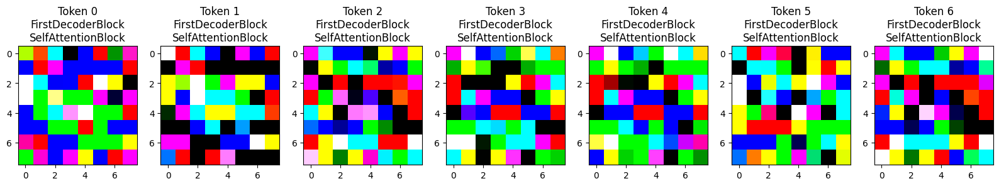

In [69]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nFirstDecoderBlock\nSelfAttentionBlock' % i)

    
plt.show()

Visualize Image embedding. It should not be updated

In [70]:
def viz_img_emb_decoder1_selfA(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFirstDecoderBlock\nSelfAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

In [71]:
# point_id_to_visualize
point_id = 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


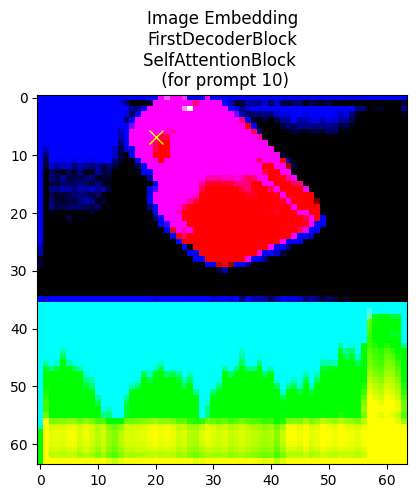

In [72]:
print(point_id)
viz_img_emb_decoder1_selfA(keys, point_id, all_points)

##### (2) Cross attention block, from tokens (as queries) to the image embedding

In [73]:
q = queries + query_pe # tokens + point_embedding
k = keys + key_pe # image embedding + image_pe
v = keys # image embedding

# Cross attention from tokens (as queries) to image embedding
# 1. q = tokens + point_embedding (tokens)
# 2. k = image embedding + image_pe (image)
# 3. v = image embedding (image)
attn_out = first_attention_block.cross_attn_token_to_image(q=q, k=k, v=keys)

queries = queries + attn_out
queries = first_attention_block.norm2(queries)

In [74]:
print(queries.shape)

torch.Size([64, 7, 256])


Visualize the updated tokens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


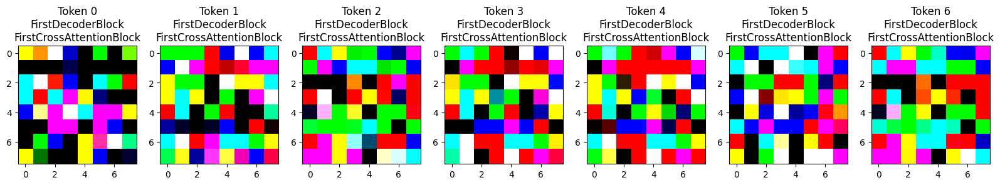

In [75]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_scaled_training_data = StandardScaler().fit_transform(updated_token_i_training_data)
    updated_token_i_reduced_data = pca.fit_transform(updated_token_i_scaled_training_data)
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nFirstDecoderBlock\nFirstCrossAttentionBlock' % i)

    
plt.show()

Visualize the image embedding. It should not be updated.

In [76]:
def viz_img_emb_decoder1_crossA1(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFirstDecoderBlock\nFirstCrossAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


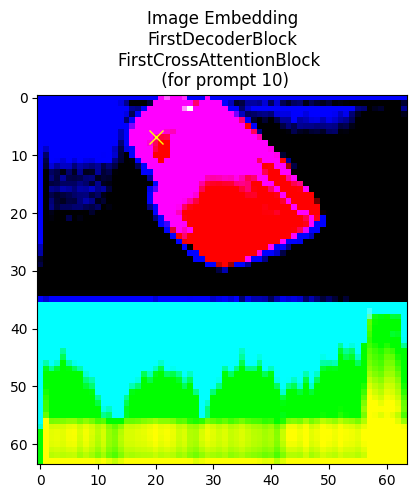

In [77]:
print(point_id)
viz_img_emb_decoder1_crossA1(keys, point_id, all_points)

##### (3) MLP block, a point-wise MLP updates each token

In [78]:
mlp_out = first_attention_block.mlp(queries)
queries = queries + mlp_out
queries = first_attention_block.norm3(queries)

In [79]:
print(queries.shape)

torch.Size([64, 7, 256])


Visualize the tokens (queries)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


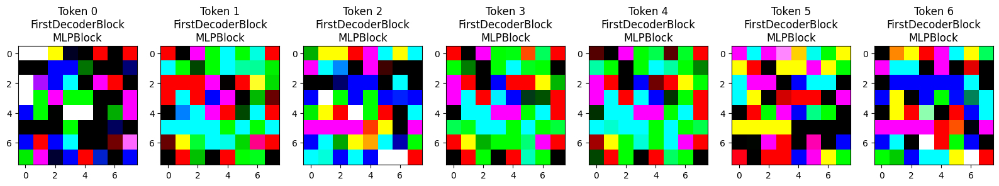

In [80]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.title('Token %d\nFirstDecoderBlock\nMLPBlock' % i)
    plt.imshow(updated_token_i_img)
    
plt.show()

Visualize the image embedding. It should not be updated.

In [81]:
def viz_img_emb_decoder1_MLP(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFirstDecoderBlock\nMLPBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


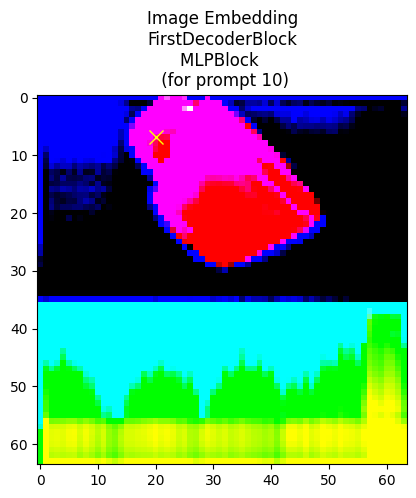

In [82]:
print(point_id)
viz_img_emb_decoder1_MLP(keys, point_id, all_points)

##### (4) Cross attention block, from image embedding (as queries) to tokens

In [83]:
# Cross attention block, image embedding attending to tokens
q = queries + query_pe # tokens + point_embedding
k = keys + key_pe # image_embedding + image_pe

# Cross attention from iamge embedding (as queries) to tokens
# 1. queries = k = image_embedding + image_pe (image)
# 2. keys = q = tokens + point_embedding (tokens)
# 3. values = queries = tokens (tokens)
attn_out = first_attention_block.cross_attn_image_to_token(q=k, k=q, v=queries)
keys = keys + attn_out
keys = first_attention_block.norm4(keys)

In [84]:
print(keys.shape)

torch.Size([64, 4096, 256])


Visualize the updated image embedding

In [85]:
updated_image_embeddidng1 = keys
print(updated_image_embeddidng1.shape)

torch.Size([64, 4096, 256])


In [86]:
def viz_img_emb_decoder1_crossA2(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFirstDecoderBlock\nSecondCrossAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


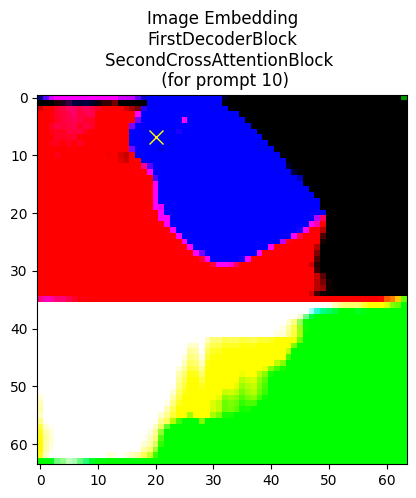

In [87]:
print(point_id)
viz_img_emb_decoder1_crossA2(updated_image_embeddidng1, point_id, all_points)

Visualize the updated tokens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


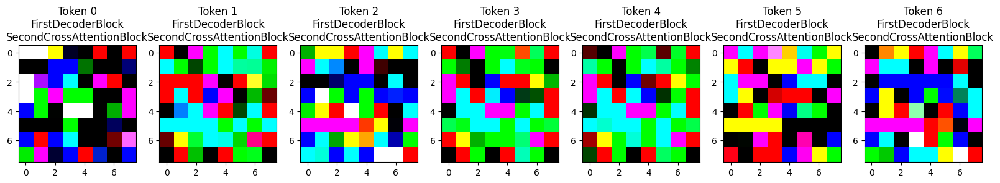

In [88]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nFirstDecoderBlock\nSecondCrossAttentionBlock' % i)

    
plt.show()

#### Second Decoder Block

Step by step visualization of 

```python
queries, keys = second_attention_block(
                queries=queries, # point_embedding = tokens [64, 7, 256], this will be updated for the second attention block
                keys=keys, # image_embedding [64, 4096, 256]
                query_pe=point_embedding, # point_embedding = tokens [64, 7, 256], this will not be updated for the second attention block
                key_pe=image_pe, # [64, 4096, 256]
            )
```

In [89]:
print(second_attention_block)

TwoWayAttentionBlock(
  (self_attn): Attention(
    (q_proj): Linear(in_features=256, out_features=256, bias=True)
    (k_proj): Linear(in_features=256, out_features=256, bias=True)
    (v_proj): Linear(in_features=256, out_features=256, bias=True)
    (out_proj): Linear(in_features=256, out_features=256, bias=True)
  )
  (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (cross_attn_token_to_image): Attention(
    (q_proj): Linear(in_features=256, out_features=128, bias=True)
    (k_proj): Linear(in_features=256, out_features=128, bias=True)
    (v_proj): Linear(in_features=256, out_features=128, bias=True)
    (out_proj): Linear(in_features=128, out_features=256, bias=True)
  )
  (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (mlp): MLPBlock(
    (lin1): Linear(in_features=256, out_features=2048, bias=True)
    (lin2): Linear(in_features=2048, out_features=256, bias=True)
    (act): ReLU()
  )
  (norm3): LayerNorm((256,), eps=1e-05, elementwise_affine=

In [90]:
print(second_attention_block.skip_first_layer_pe) # i = 1 (second attention block) should be False

False


In [91]:
queries = queries # updated tokens
keys = keys # updated image_embedding
query_pe = point_embedding 
key_pe = image_pe

##### (1) Self attention block

In [92]:
if second_attention_block.skip_first_layer_pe: # This is False
    # queries = first_attention_block.self_attn(q=queries, k=queries, v=queries)
    pass
else:
    print("Executed")

    # Self attention on the tokens
    # 1. q: updated queries + query positional encoding
    # 2. k: q
    # 3. v: updated queries
    q = queries + query_pe
    attn_out = second_attention_block.self_attn(q=q, k=q, v=queries)
    queries = queries + attn_out

Executed


In [93]:
queries = second_attention_block.norm1(queries)

In [94]:
print(queries.shape)

torch.Size([64, 7, 256])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


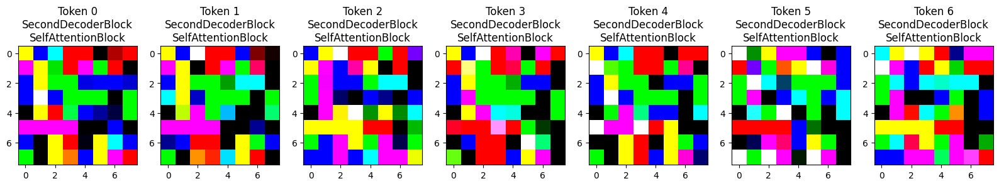

In [95]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nSecondDecoderBlock\nSelfAttentionBlock' % i)

    
plt.show()

In [96]:
def viz_img_emb_decoder2_selfA(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nSecondDecoderBlock\nSelfAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


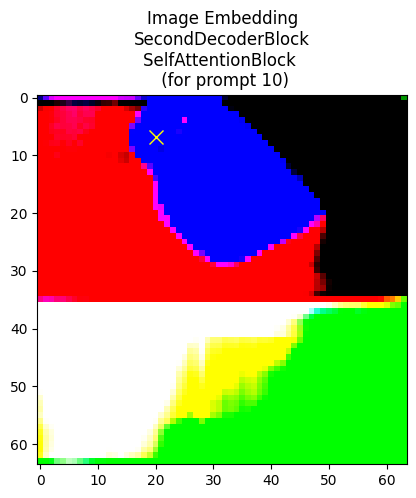

In [97]:
print(point_id)
viz_img_emb_decoder2_selfA(keys, point_id, all_points)

##### (2) Cross attention block, from tokens (as queries) to the image embedding

In [98]:
q = queries + query_pe # tokens + point_embedding
k = keys + key_pe # image embedding + image_pe
v = keys # image embedding

# Cross attention from tokens (as queries) to image embedding
# 1. q = tokens + point_embedding (tokens)
# 2. k = image embedding + image_pe (image)
# 3. v = image embedding (image)
attn_out = second_attention_block.cross_attn_token_to_image(q=q, k=k, v=keys)

queries = queries + attn_out
queries = second_attention_block.norm2(queries)

In [99]:
print(queries.shape)

torch.Size([64, 7, 256])


Visualize the updated tokens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


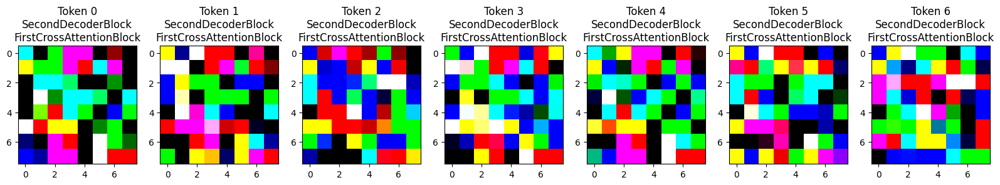

In [100]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nSecondDecoderBlock\nFirstCrossAttentionBlock' % i)

    
plt.show()

Visualize the image embedding. It should not be updated.

In [101]:
def viz_img_emb_decoder2_crossA1(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nSecondDecoderBlock\nFirstCrossAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


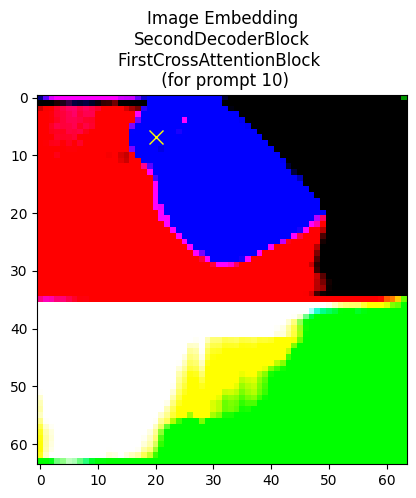

In [102]:
print(point_id)
viz_img_emb_decoder2_crossA1(keys, point_id, all_points)

##### (3) MLP block, a point-wise MLP updates each token

In [103]:
mlp_out = second_attention_block.mlp(queries)
queries = queries + mlp_out
queries = second_attention_block.norm3(queries)

In [104]:
print(queries.shape)

torch.Size([64, 7, 256])


Visualize the tokens (queries)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


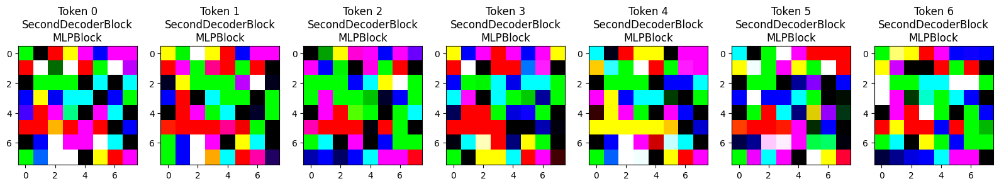

In [105]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nSecondDecoderBlock\nMLPBlock' % i)

    
plt.show()

Visualize the image embedding. It should not be updated.

In [106]:
def viz_img_emb_decoder2_MLP(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nSecondDecoderBlock\nMLPBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


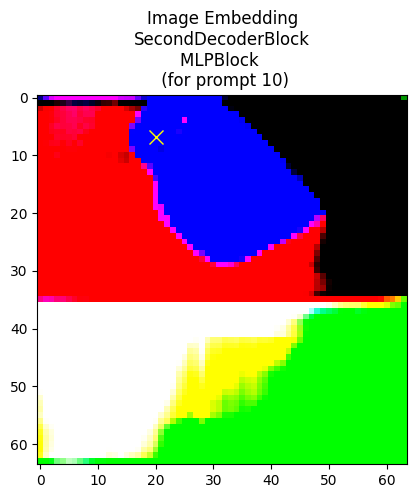

In [107]:
print(point_id)
viz_img_emb_decoder2_MLP(keys, point_id, all_points)

##### (4) Cross attention block, from image embedding (as queries) to tokens

In [108]:
# Cross attention block, image embedding attending to tokens
q = queries + query_pe # tokens + point_embedding
k = keys + key_pe # image_embedding + image_pe

# Cross attention from iamge embedding (as queries) to tokens
# 1. queries = k = image_embedding + image_pe (image)
# 2. keys = q = tokens + point_embedding (tokens)
# 3. values = queries = tokens (tokens)
attn_out = second_attention_block.cross_attn_image_to_token(q=k, k=q, v=queries)
keys = keys + attn_out
keys = second_attention_block.norm4(keys)

In [109]:
print(keys.shape)

torch.Size([64, 4096, 256])


Visualize the updated image embedding

In [110]:
updated_image_embeddidng2 = keys
print(updated_image_embeddidng2.shape)

torch.Size([64, 4096, 256])


In [111]:
def viz_img_emb_decoder2_crossA2(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'yellow'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nSecondDecoderBlock\nSecondCrossAttentionBlock \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


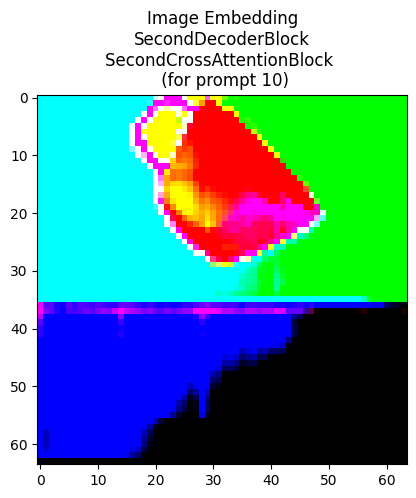

In [112]:
print(point_id)
viz_img_emb_decoder2_crossA2(updated_image_embeddidng2, point_id, all_points)

Visualize the updated tokens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


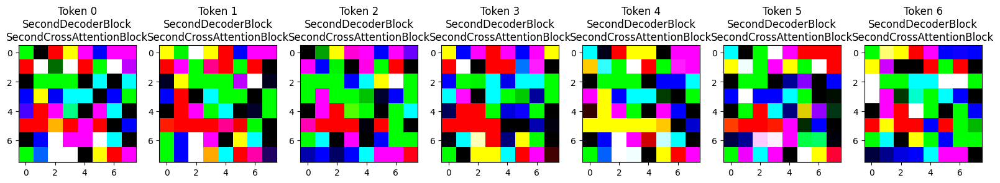

In [113]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = queries[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nSecondDecoderBlock\nSecondCrossAttentionBlock' % i)

    
plt.show()

#### Final attention layer from the points (as queries) to the image

In [114]:
# Apply the final attention layer from the points to the image
q = queries + point_embedding
k = keys + image_pe
attn_out = decoder_transformer.final_attn_token_to_image(q=q, k=k, v=keys)
queries = queries + attn_out
queries = decoder_transformer.norm_final_attn(queries)

In [115]:
# This is the final output of `transformer()`
hs, src =  queries, keys

### After getting `transformer()` output, visualize `transformer()` results:

In [116]:
# Run the transformer
# The two decoder blocks that perform self attention and cross attention
# The image embeddings and tokens are updated.
# hs, src = mask_decoder.transformer(src, pos_src, tokens)

In [117]:
# 64: batch number, 1 batch has 64 points
# 3 + 4: 3 iou predictions, 4 mask predictions
# 256 - dimension
print(hs.shape) # (64, 3 + 4, 256)


# 64: batch number, 1 batch has 64 points
# 4096 = 64 * 64
# 256 - dimension
print(src.shape) # (64, 4096, 256)

torch.Size([64, 7, 256])
torch.Size([64, 4096, 256])


In [118]:
# Take the updated iou_token output (token 0)
iou_token_out = hs[:, 0, :]

# Take the updated mask_tokens output (token 1 to token 4)
# hs[:, 1 : (1 + 4), :] = hs[:, 1 : 5, :]
mask_tokens_out = hs[:, 1 : (1 + mask_decoder.num_mask_tokens), :]

In [119]:
print(iou_token_out.shape)
print(mask_tokens_out.shape)

torch.Size([64, 256])
torch.Size([64, 4, 256])


## Visualize updated image embeddings

Select 1 prompt point from a batch of 64 points to visualize:

In [120]:
def viz_img_emb_finalDecoder(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    rgb_src_i = reduced_data_src_i.reshape(64, 64, 3)

    grb_src_i = rgb_src_i.copy() 
    grb_src_i[..., [0, 1]] = grb_src_i[..., [1, 0]]
    plt.imshow(grb_src_i)
    point_color = 'black'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFinalDecoderOutput \n (for prompt %d)' % point_id)
    plt.show()

In [121]:
def viz_img_emb_finalDecoder_gray(src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((64, 64 * 1080 / 1920))
    
    # src = [64, 4096, 256]

    src_i = src[point_id, :, :] # [4096, 256]
    src_i_cpu = src_i.squeeze().cpu().detach().numpy()
    training_data_src_i = src_i_cpu
    reduced_data_src_i = pca_2.fit_transform(StandardScaler().fit_transform(training_data_src_i))
    print(reduced_data_src_i.shape)
    gray_src_i = reduced_data_src_i.reshape(64, 64, 1)
    
    plt.imshow(gray_src_i, cmap='gray')
    point_color = 'red'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    plt.title('Image Embedding\nFinalDecoderOutput \n (for prompt %d)' % point_id)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10
(4096, 3)


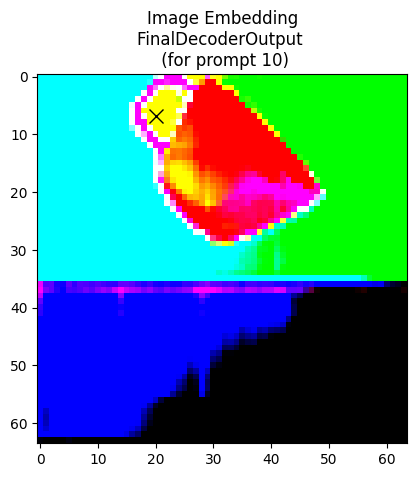

(4096, 1)


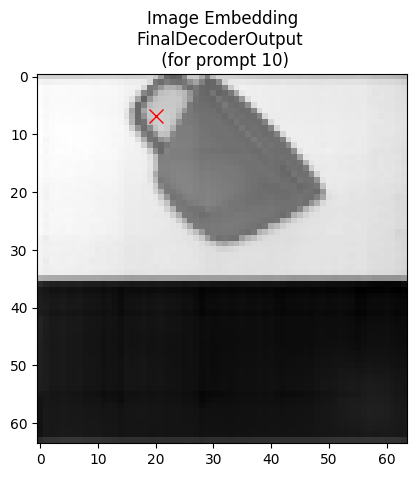

In [122]:
# Specify a point id between 0 and 63 within a batch
print(point_id)
viz_img_emb_finalDecoder(src, point_id, all_points)
viz_img_emb_finalDecoder_gray(src, point_id, all_points)

## Visualize updated tokens

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


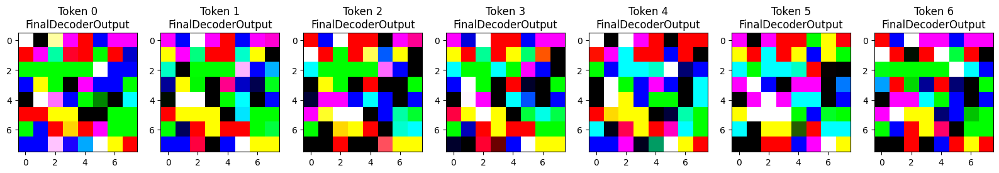

In [120]:
# Plotting the 7 tokens in one figure
fig = plt.figure(figsize=(20, 3.5))
for i in range(7):
    updated_token_i = hs[:, i, :] # [64, 256]
    updated_token_i_cpu = updated_token_i.cpu().detach().numpy()
    updated_token_i_training_data = updated_token_i_cpu
    updated_token_i_reduced_data = pca.fit_transform(StandardScaler().fit_transform(updated_token_i_training_data))
    updated_token_i_img = updated_token_i_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 7, i+1)
    plt.imshow(updated_token_i_img)
    plt.title('Token %d\nFinalDecoderOutput' % i)

    
plt.show()

## Upscale updated image embeddings

Upscaling the updated image embeddings:
* GPU usage increases rom 5.9Gi to 8.88Gi / 11Gi

In [121]:
# Upscale mask embeddings and predict masks using the mask tokens
src = src.transpose(1, 2).view(b, c, h, w)
upscaled_embedding = mask_decoder.output_upscaling(src)
b, c, h, w = upscaled_embedding.shape

OutOfMemoryError: CUDA out of memory. Tried to allocate 512.00 MiB (GPU 0; 10.75 GiB total capacity; 6.42 GiB already allocated; 87.25 MiB free; 6.62 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
print(b, c, h, w)

64 32 256 256


In [ ]:
def viz_upscaled_img_embedding_for_point(upscaled_src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((256, 256 * 1080 / 1920))

    upscaled_embedding_i = upscaled_src[point_id, :, :, :] # (32, 256, 256)
    upscaled_embedding_i_cpu = upscaled_embedding_i.cpu().detach().numpy() # (32, 256, 256)
    training_data_upscaled_embedding_i = upscaled_embedding_i_cpu.reshape(32, 256 * 256).T # (256 x 256, 32)
    reduced_data_upscaled_embedding_i = pca.fit_transform(StandardScaler().fit_transform(training_data_upscaled_embedding_i)) # (256 x 256, 3)
    rgb_upscaled_embedding_i = reduced_data_upscaled_embedding_i.reshape(256, 256, 3)

    grb_upscaled_embedding_i = rgb_upscaled_embedding_i.copy() 
    grb_upscaled_embedding_i[..., [0, 1]] = grb_upscaled_embedding_i[..., [1, 0]]
    plt.imshow(grb_upscaled_embedding_i)
    
    point_color = 'white'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    
    plt.title('Upscaled Updated Image Embedding \n (for prompt %d)' % point_id)
    plt.show()


In [ ]:
def viz_upscaled_img_embedding_for_point_grayscale(upscaled_src, point_id, all_points):
    if point_id < 0 or point_id > 63:
        print("poitn_id should be betwee [0, 63]")
        return
    prompt_point = all_points[point_id] * np.array((256, 256 * 1080 / 1920))

    upscaled_embedding_i = upscaled_src[point_id, :, :, :] # (32, 256, 256)
    upscaled_embedding_i_cpu = upscaled_embedding_i.cpu().detach().numpy() # (32, 256, 256)
    training_data_upscaled_embedding_i = upscaled_embedding_i_cpu.reshape(32, 256 * 256).T # (256 x 256, 32)
    reduced_data_upscaled_embedding_i = pca_2.fit_transform(StandardScaler().fit_transform(training_data_upscaled_embedding_i)) # (256 x 256, 3)
    gray_upscaled_embedding_i = reduced_data_upscaled_embedding_i.reshape(256, 256, 1)

    plt.imshow(gray_upscaled_embedding_i, cmap='gray')
    
    point_color = 'red'
    plt.plot(prompt_point[0], prompt_point[1], markersize=10, marker="x", color=point_color)
    
    plt.title('Upscaled Updated Image Embedding \n (for prompt %d)' % point_id)
    plt.show()


10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


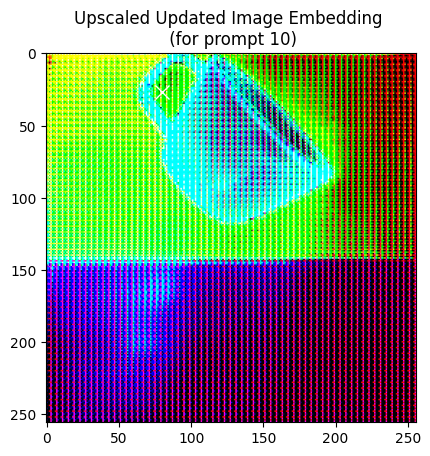

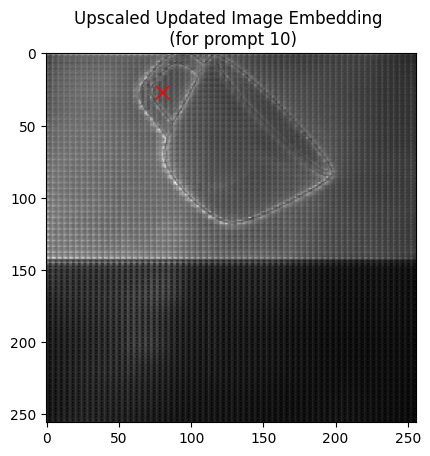

In [ ]:
print(point_id)
viz_upscaled_img_embedding_for_point(upscaled_embedding, point_id, all_points)
viz_upscaled_img_embedding_for_point_grayscale(upscaled_embedding, point_id, all_points)

## Pass updated tokens to corresponding MLPs

In [ ]:
# Pass mask tokens to the corresponding MLP
hyper_in_list = []
for i in range(4):
    # 256-d to 32-d
    hyper_in_list.append(mask_decoder.output_hypernetworks_mlps[i](mask_tokens_out[:, i, :]))
hyper_in = torch.stack(hyper_in_list, dim=1)

In [ ]:
print(hyper_in.shape)

torch.Size([64, 4, 32])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


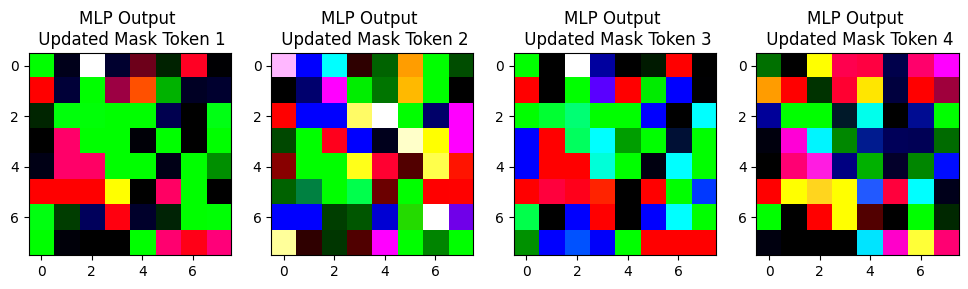

In [ ]:
# Plotting the 4 tokens in one figure
fig = plt.figure(figsize=(12, 3.5))
for i in range(4):
    mlp_output = hyper_in_list[i]
    mlp_output_cpu = mlp_output.cpu().detach().numpy() # [64, 32]
    mlp_output_cpu_pca_training_data = mlp_output_cpu # [64, 32]
    mlp_output_cpu_pca_reduced_data = pca.fit_transform(StandardScaler().fit_transform(mlp_output_cpu_pca_training_data)) # [64, 3]
    mlp_output_img = mlp_output_cpu_pca_reduced_data.reshape(8, 8, 3)

    plt.subplot(1, 4, i+1)
    plt.imshow(mlp_output_img)
    plt.title('MLP Output \n Updated Mask Token %d' % (i+1))

    
plt.show()

## Dot product to get Low-Resolution Masks

`masks`, `iou_pred` are the output of `MaskDecoder.forward()`. 

In [ ]:
# Dot product upscaled_embedding and hyper_in to get the masks
masks = (hyper_in @ upscaled_embedding.view(b, c, h * w)).view(b, -1, h, w)

In [ ]:
print(masks.shape)

torch.Size([64, 4, 256, 256])


In [ ]:
print(hyper_in.shape)

torch.Size([64, 4, 32])


In [ ]:
print(b, c, h, w)
print(upscaled_embedding.view(b, c, h * w).shape)

64 32 256 256
torch.Size([64, 32, 65536])


In [ ]:
print((hyper_in @ upscaled_embedding.view(b, c, h * w)).shape)

torch.Size([64, 4, 65536])


batch_id =  0


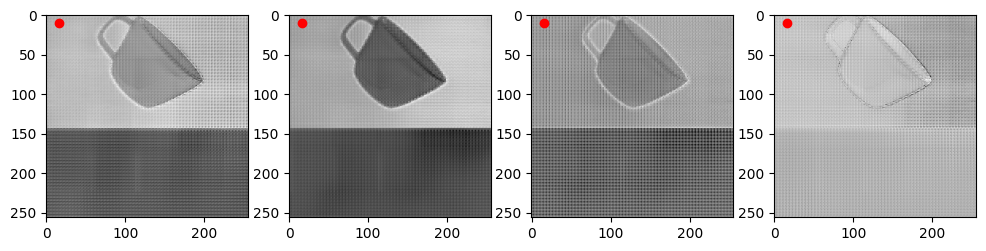

batch_id =  1


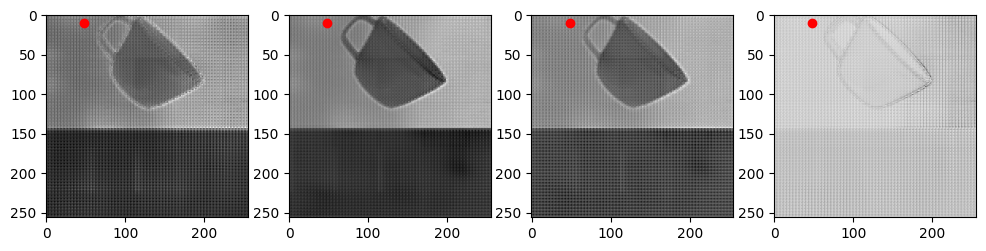

batch_id =  2


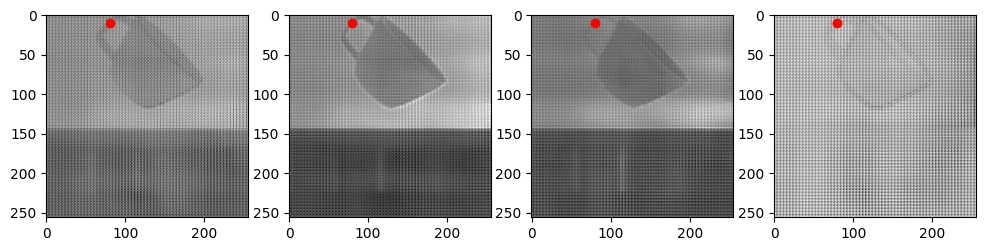

batch_id =  3


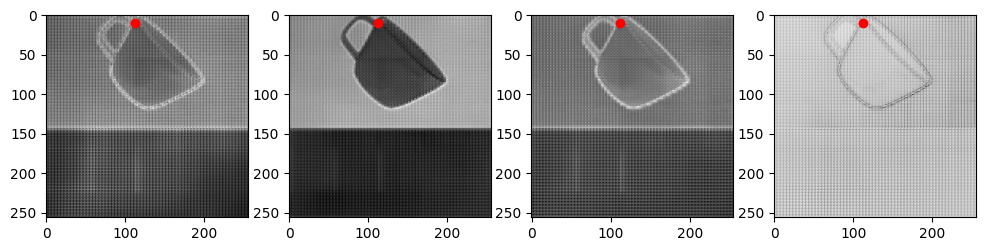

batch_id =  4


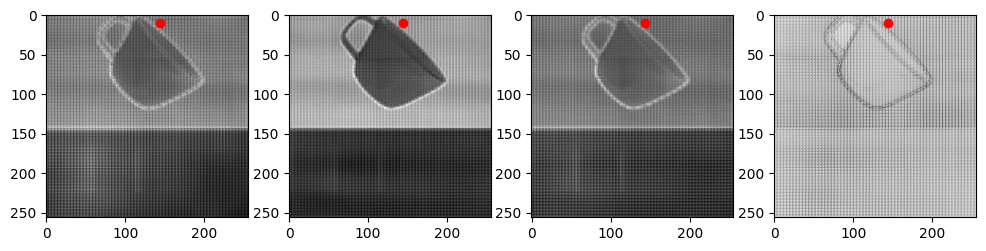

batch_id =  5


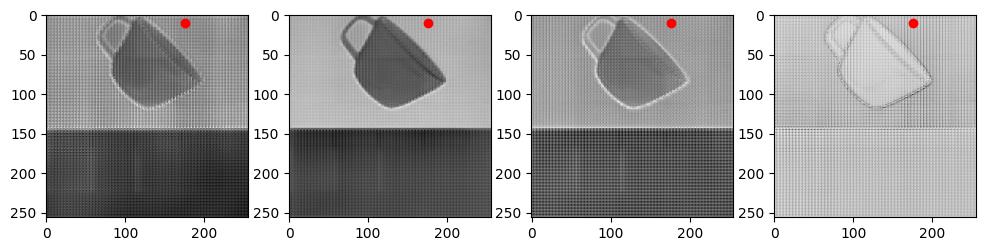

batch_id =  6


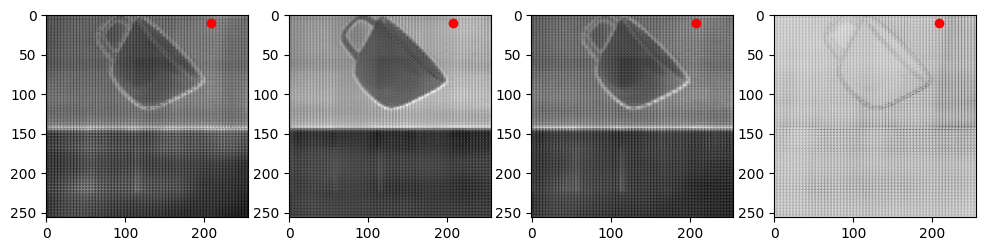

batch_id =  7


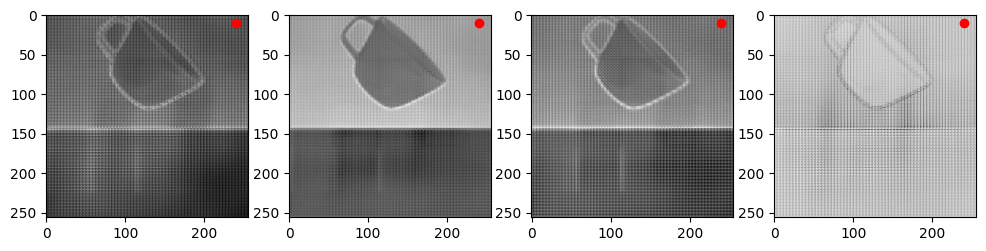

batch_id =  8


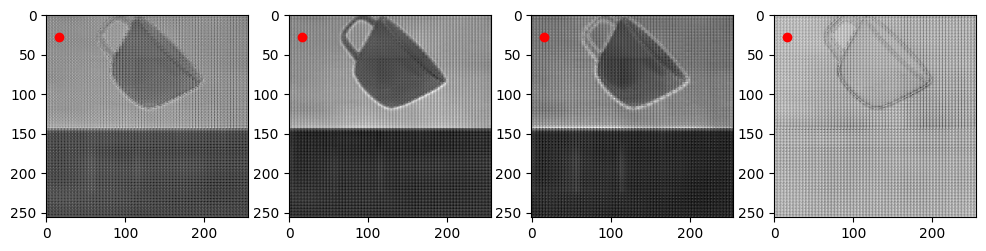

batch_id =  9


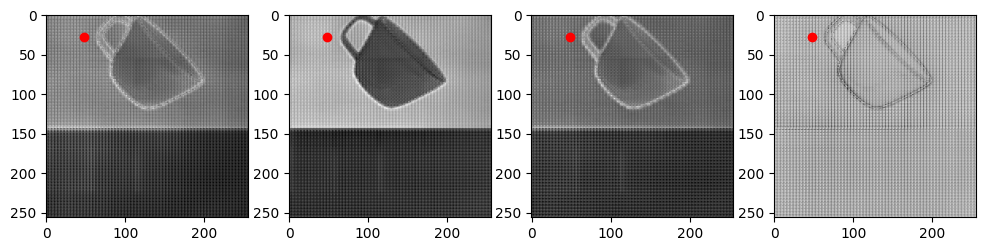

batch_id =  10


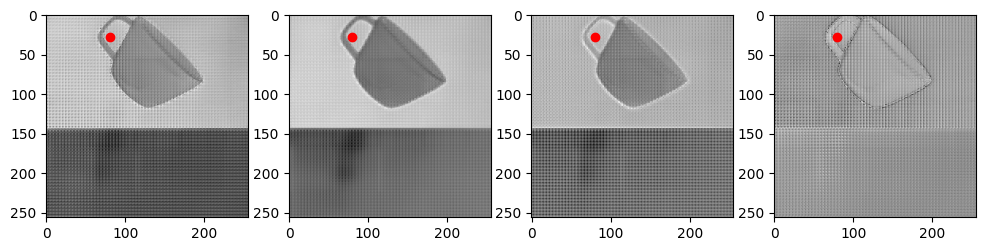

batch_id =  11


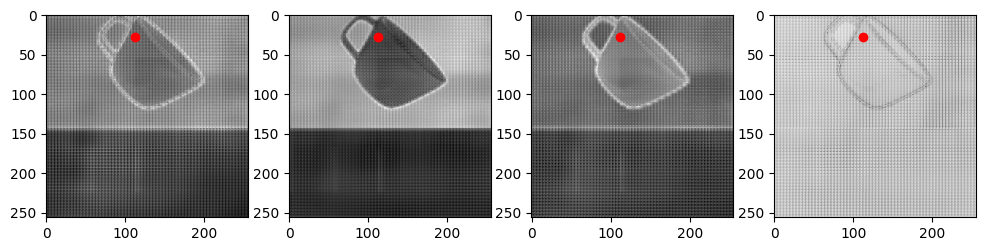

batch_id =  12


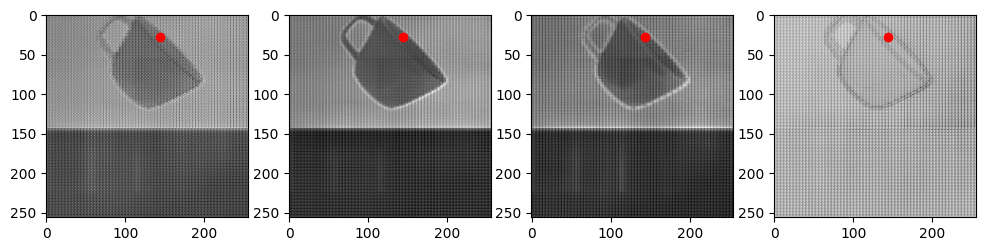

batch_id =  13


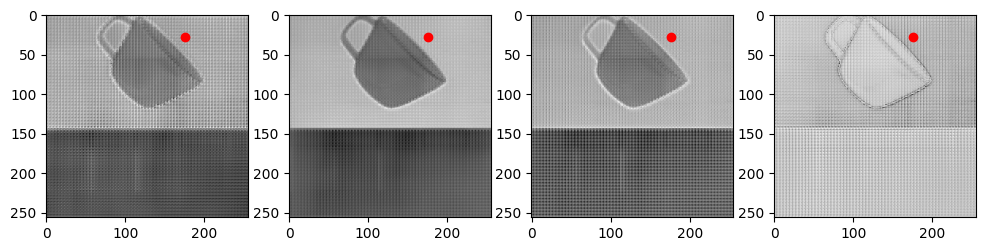

batch_id =  14


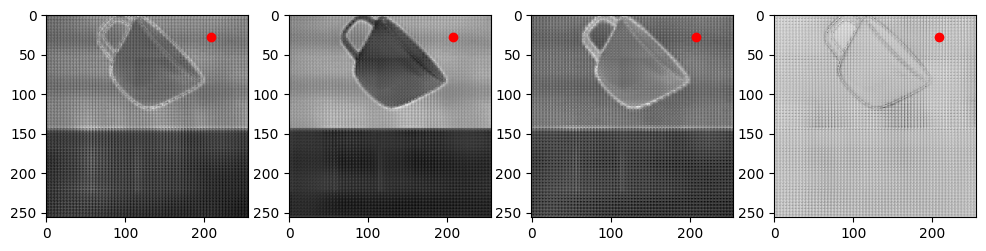

batch_id =  15


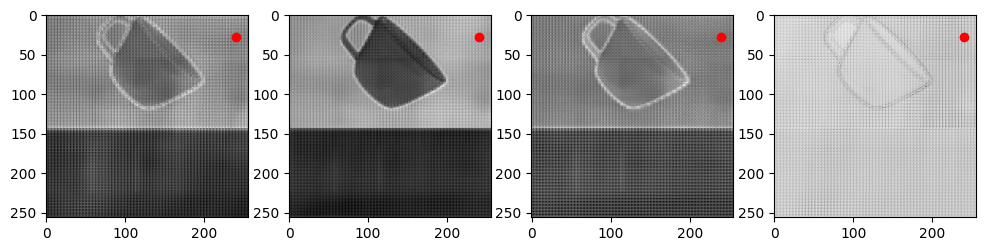

batch_id =  16


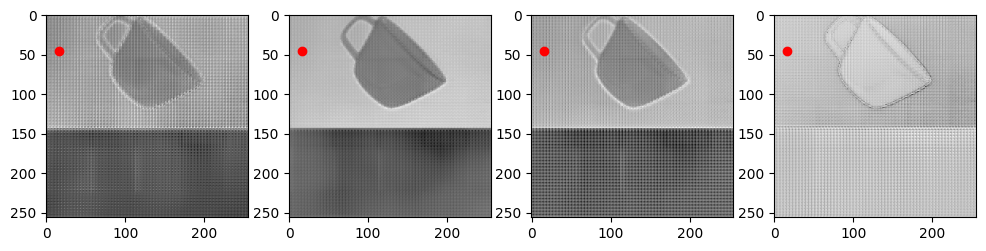

batch_id =  17


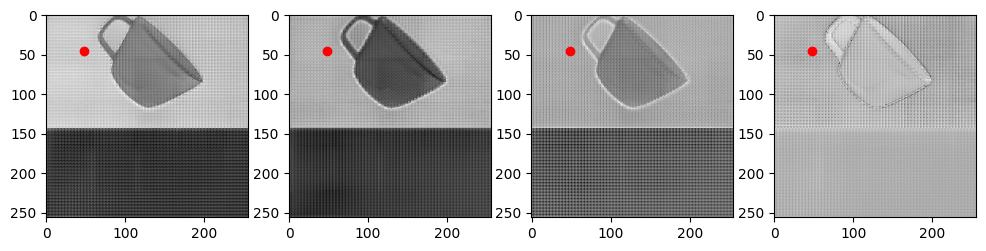

batch_id =  18


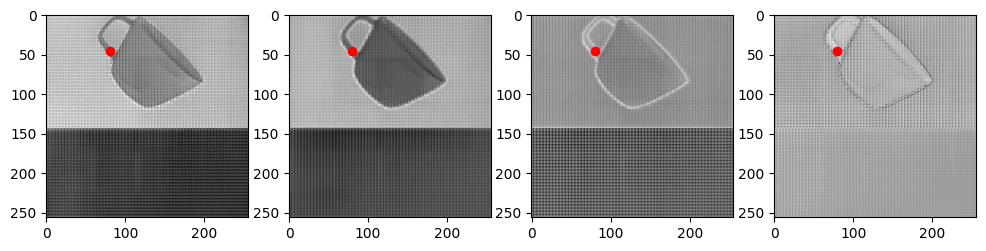

batch_id =  19


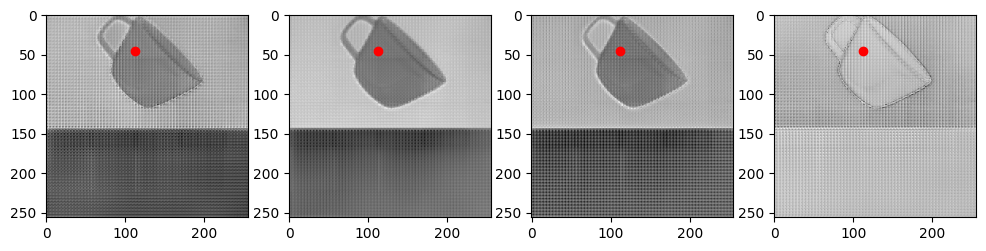

batch_id =  20


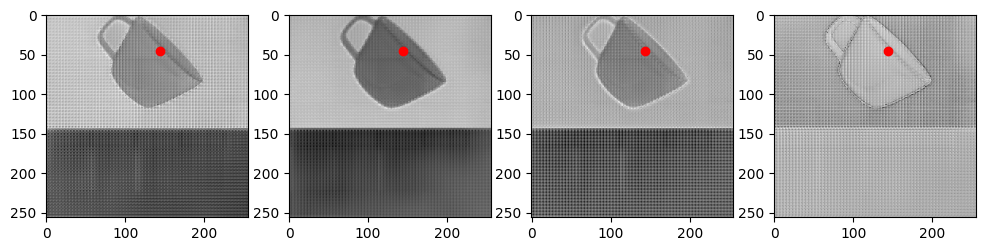

batch_id =  21


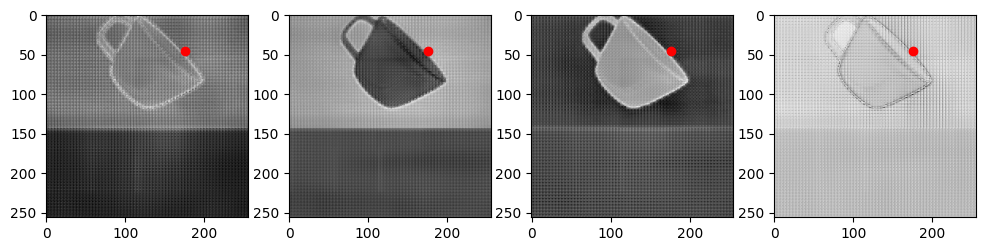

batch_id =  22


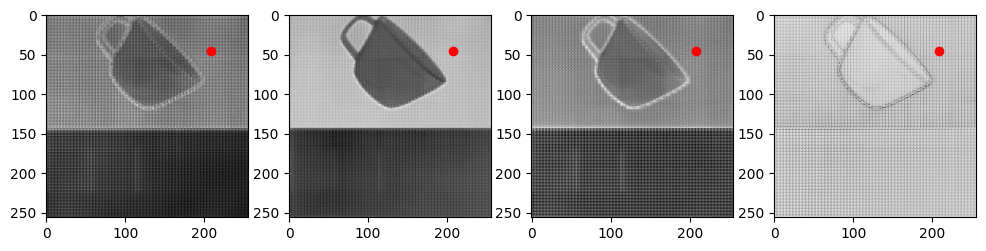

batch_id =  23


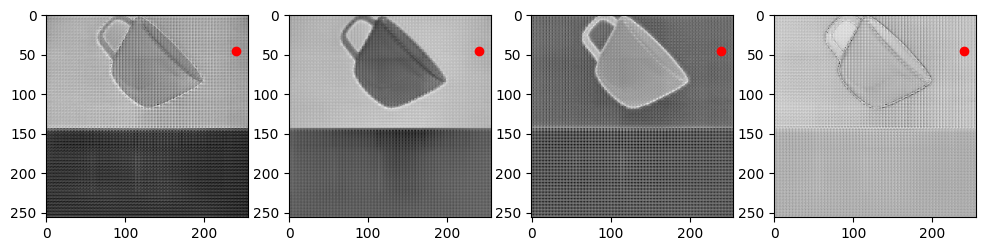

batch_id =  24


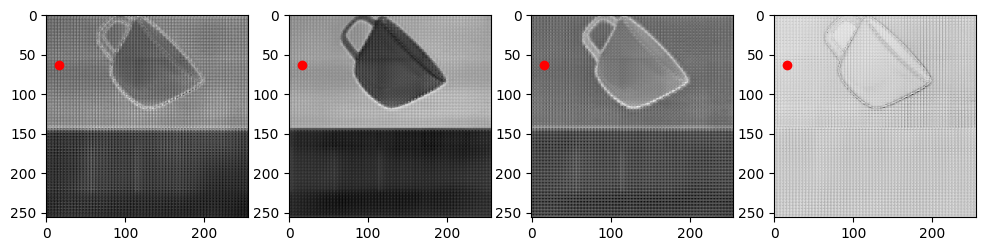

batch_id =  25


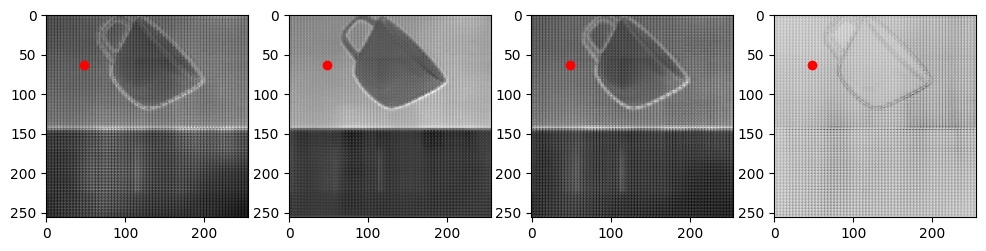

batch_id =  26


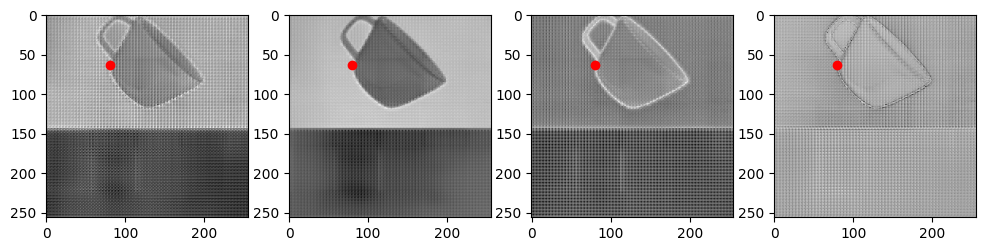

batch_id =  27


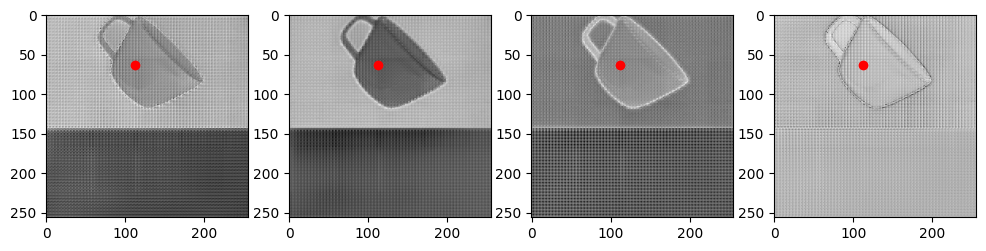

batch_id =  28


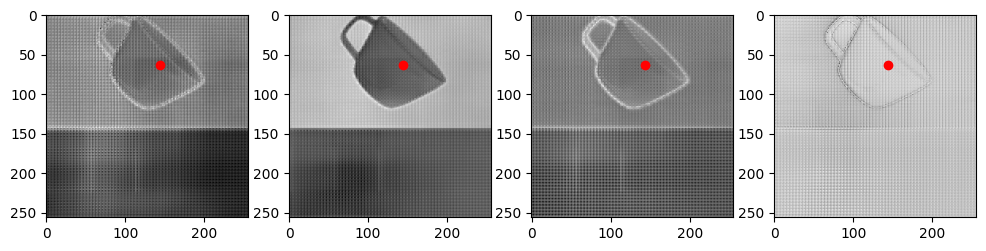

batch_id =  29


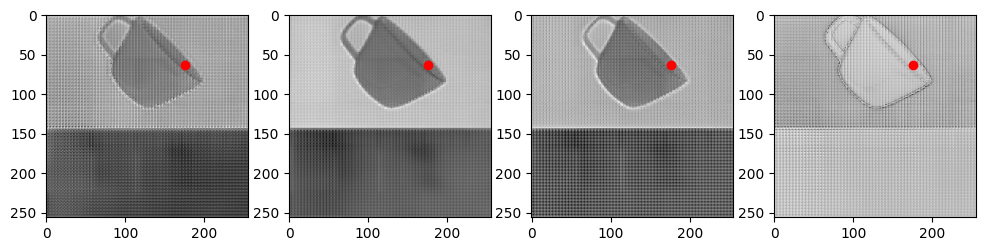

batch_id =  30


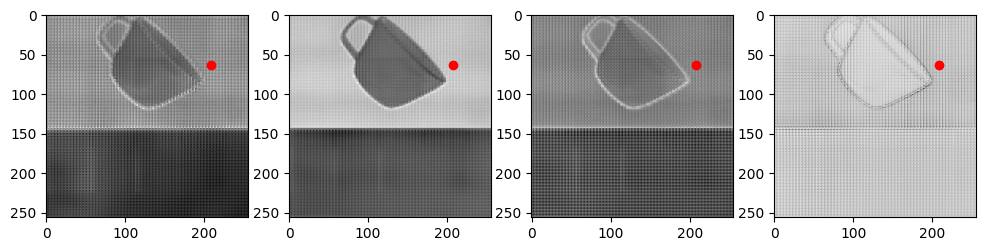

batch_id =  31


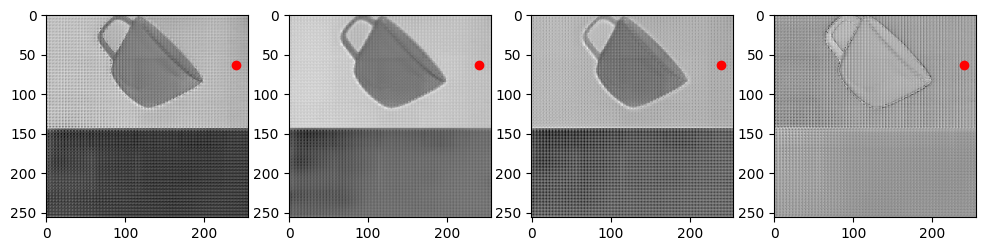

batch_id =  32


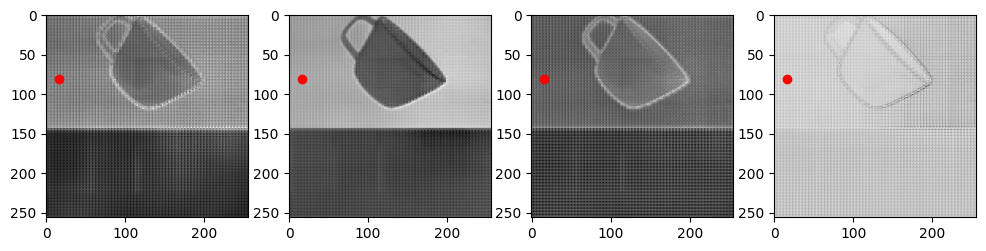

batch_id =  33


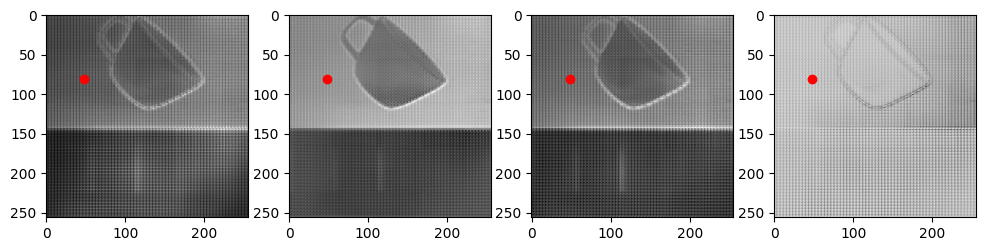

batch_id =  34


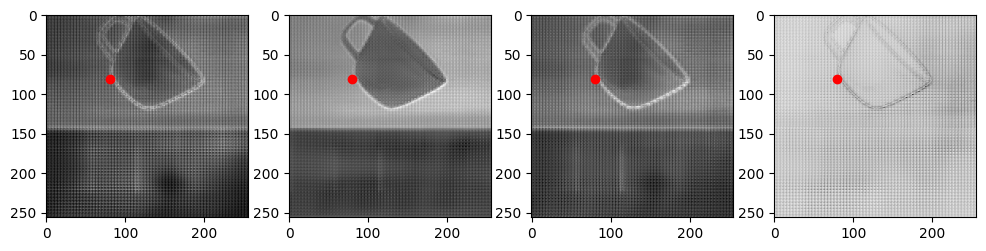

batch_id =  35


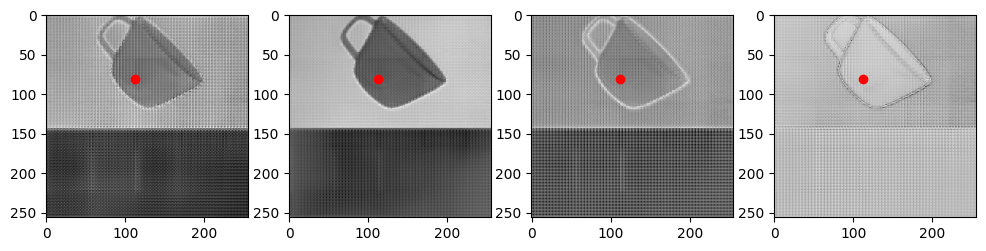

batch_id =  36


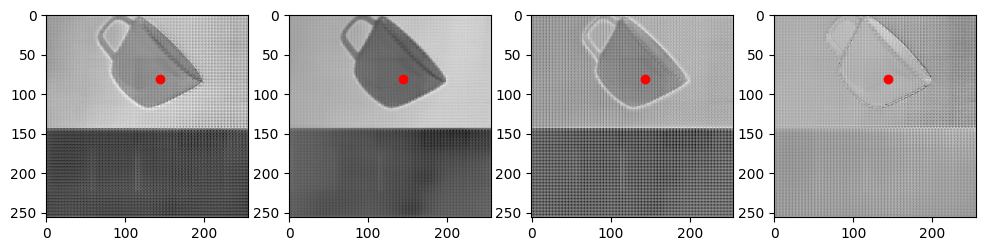

batch_id =  37


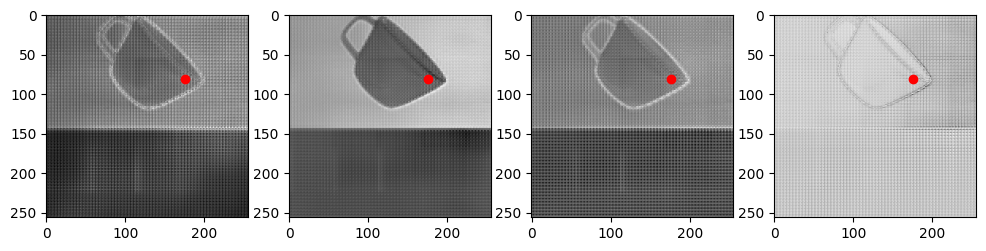

batch_id =  38


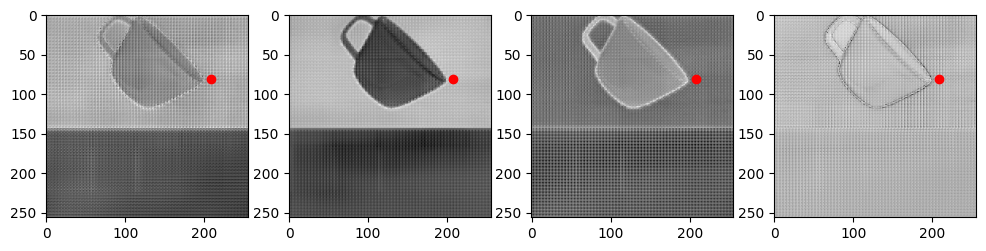

batch_id =  39


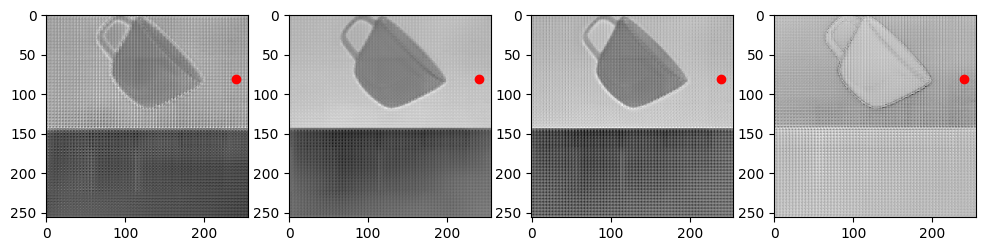

batch_id =  40


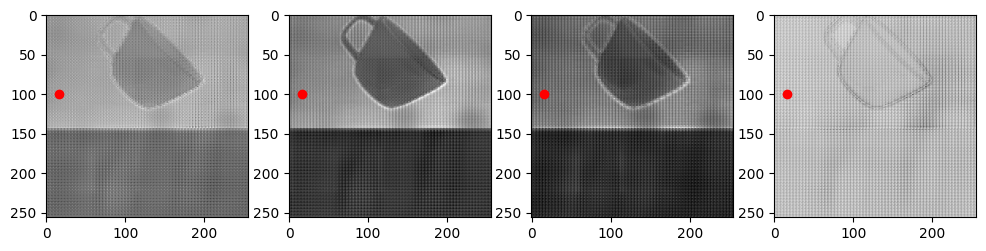

batch_id =  41


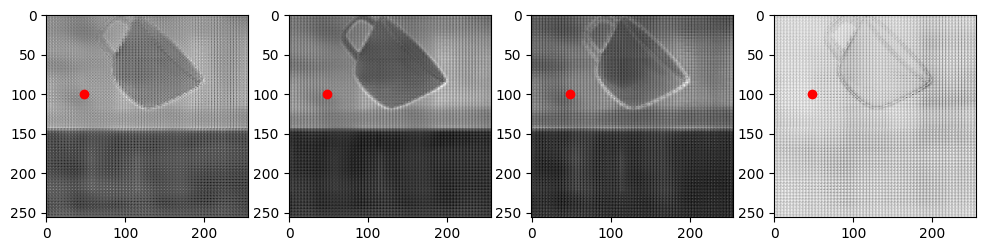

batch_id =  42


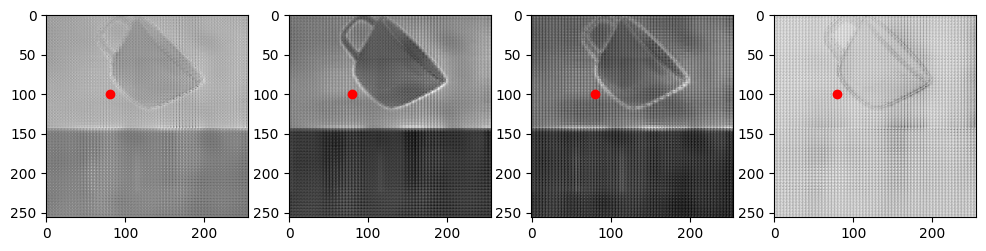

batch_id =  43


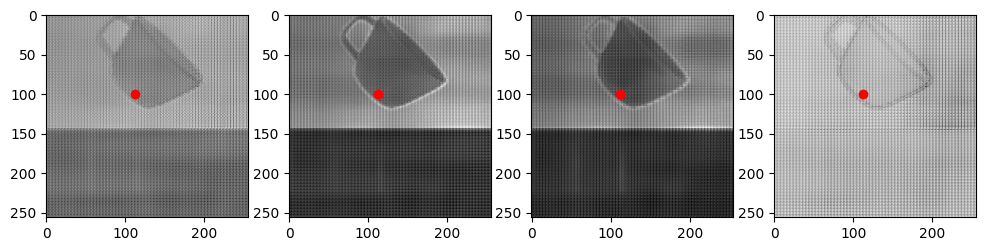

batch_id =  44


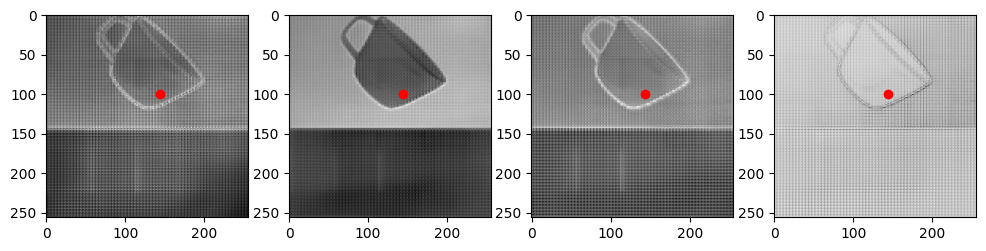

batch_id =  45


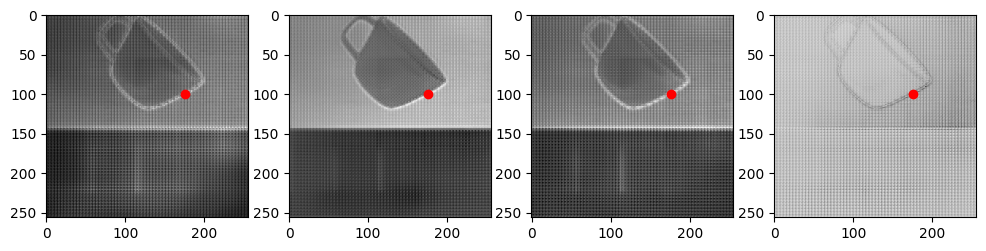

batch_id =  46


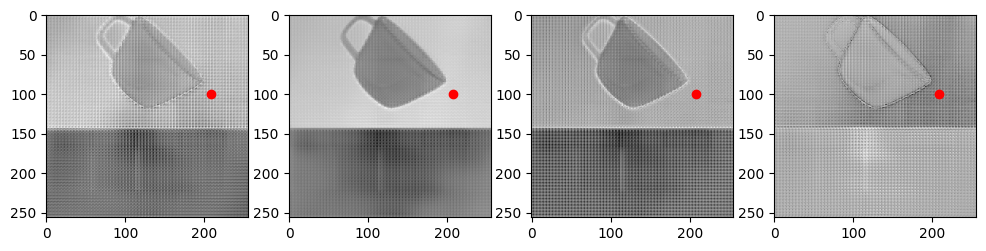

batch_id =  47


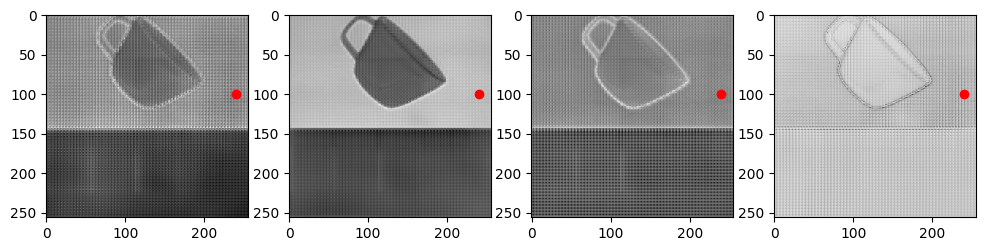

batch_id =  48


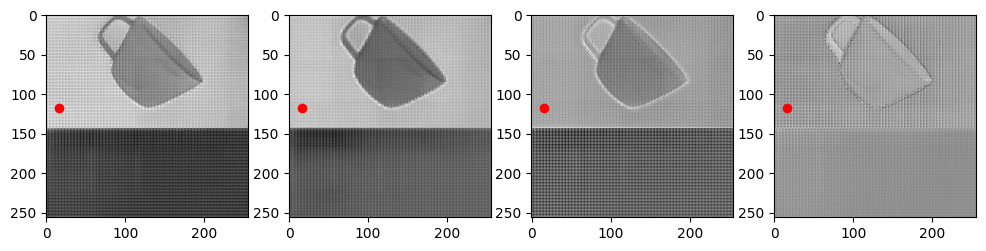

batch_id =  49


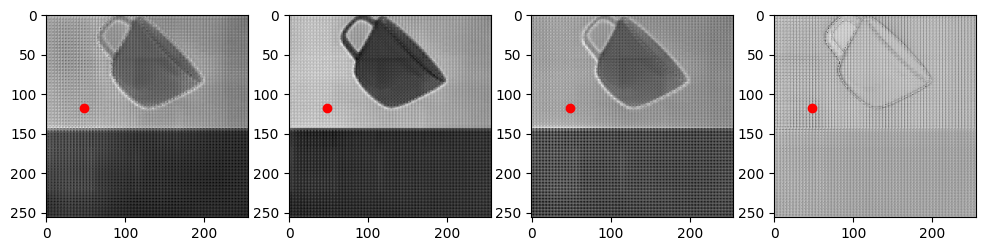

batch_id =  50


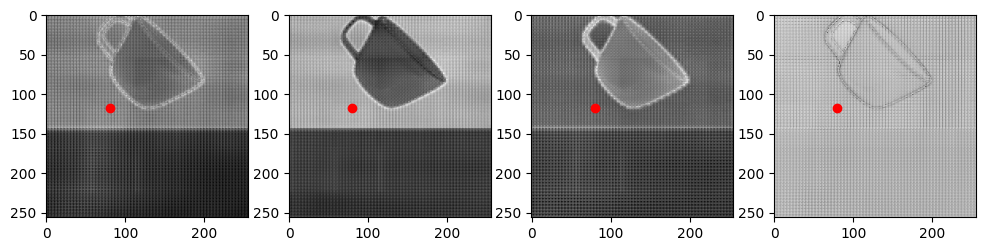

batch_id =  51


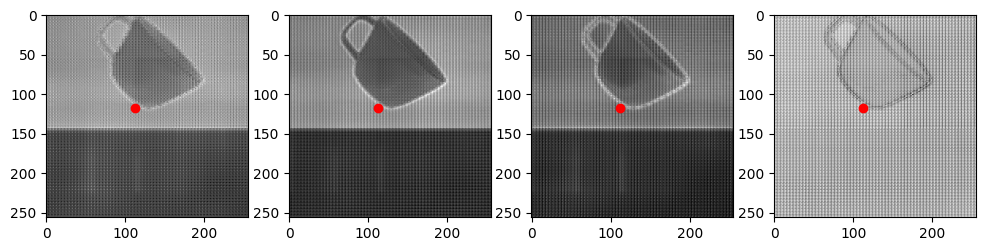

batch_id =  52


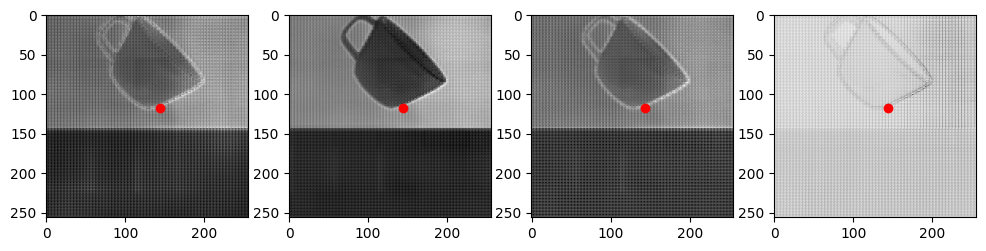

batch_id =  53


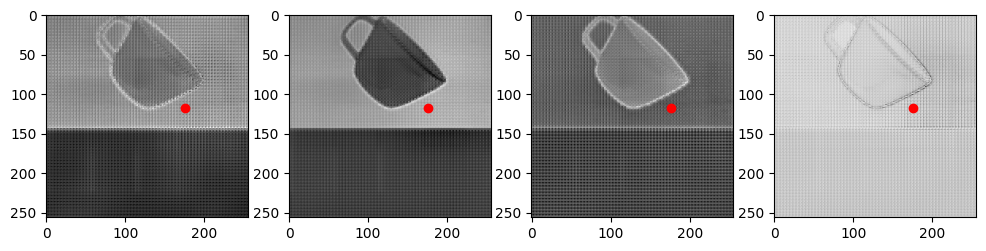

batch_id =  54


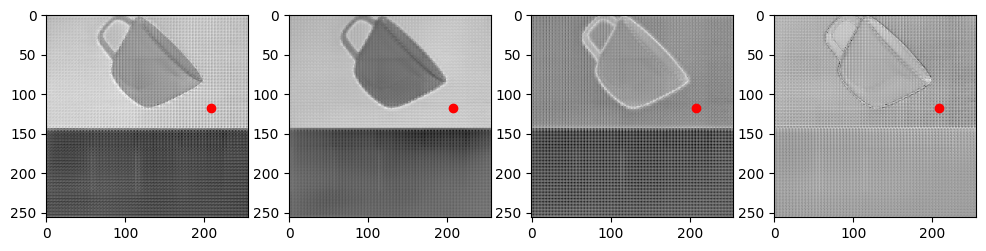

batch_id =  55


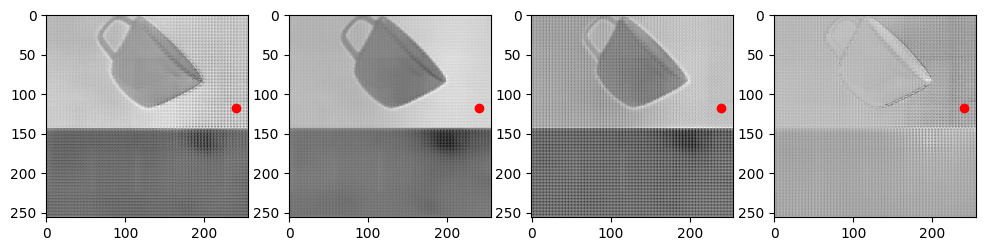

batch_id =  56


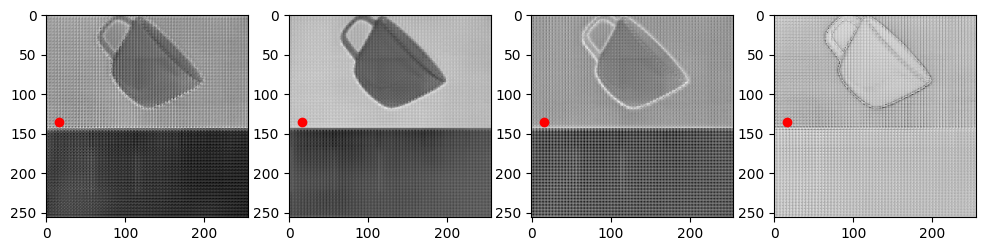

batch_id =  57


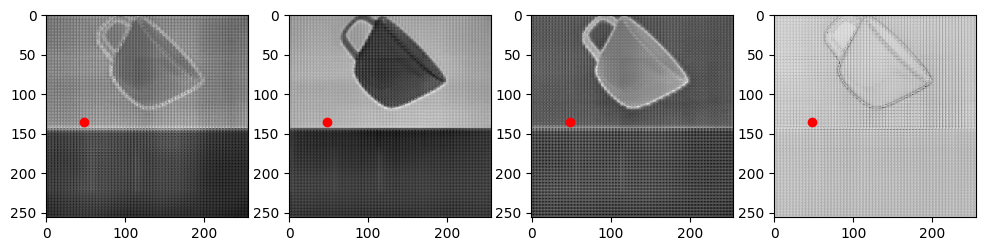

batch_id =  58


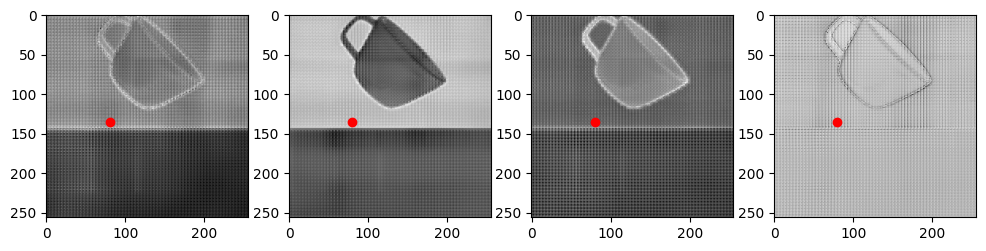

batch_id =  59


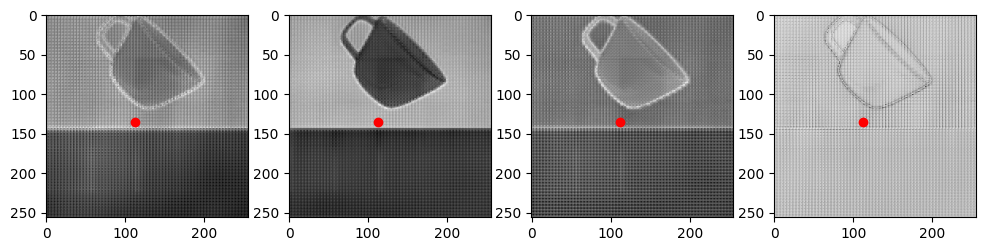

batch_id =  60


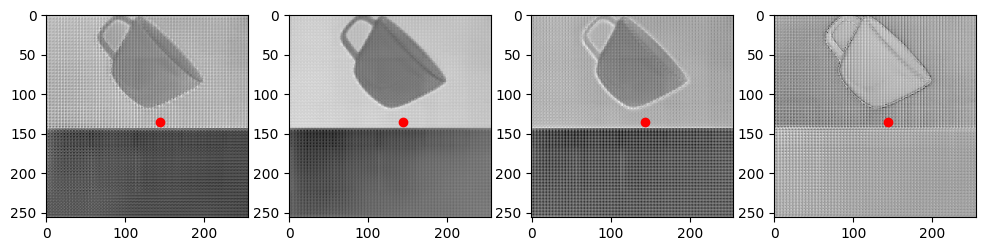

batch_id =  61


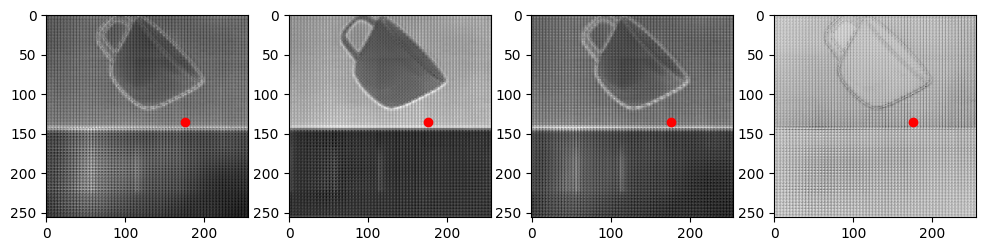

batch_id =  62


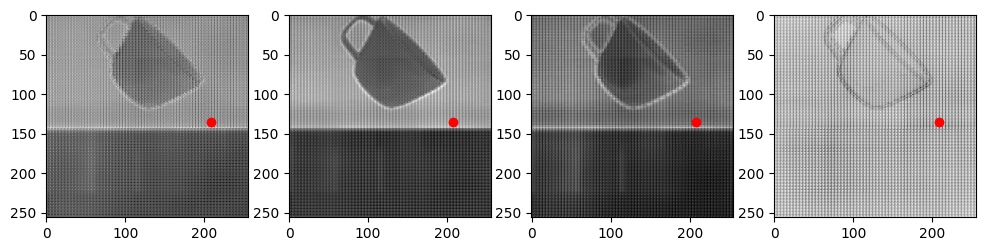

batch_id =  63


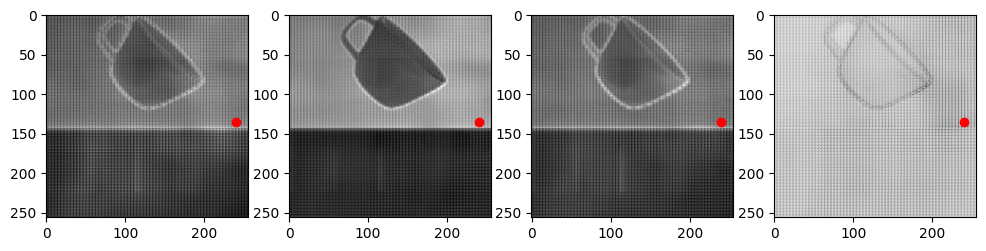

In [ ]:
for batch_id in range(64):

    fig = plt.figure(figsize=(12, 3.5))
    print("batch_id = ", batch_id)
    for mask_id in range(4):

        curr_mask = masks[batch_id, mask_id, :, :]
        curr_mask_cpu = curr_mask.cpu().detach().numpy()

        prompt_point = all_points[batch_id] * np.array((256, 256 * 1080 / 1920))

        plt.subplot(1, 4, mask_id+1)
        plt.plot(prompt_point[0], prompt_point[1], marker="o", color='red')
        plt.imshow(curr_mask_cpu, cmap='gray')

    plt.show()


In [ ]:
print(masks.shape)

torch.Size([64, 4, 256, 256])


## IoU Prediction

`masks`, `iou_pred` are the output of `MaskDecoder.forward()`. 

In [ ]:
# Generate mask quality predictions
iou_pred = mask_decoder.iou_prediction_head(iou_token_out)

In [ ]:
print(iou_pred.shape) # [64, 4]

torch.Size([64, 4])


In [ ]:
print(iou_pred)

tensor([[0.1483, 1.2179, 0.9188, 0.3687],
        [0.0967, 1.1000, 0.7333, 0.3010],
        [0.3877, 0.7820, 0.4366, 0.5244],
        [0.1592, 1.0562, 0.6571, 0.3627],
        [0.1740, 1.0455, 0.6378, 0.3669],
        [0.0948, 1.1708, 0.7996, 0.3576],
        [0.1738, 1.0293, 0.5572, 0.3683],
        [0.0959, 1.1025, 0.6573, 0.3387],
        [0.3532, 0.8973, 0.5170, 0.4886],
        [0.1824, 1.0020, 0.6287, 0.3629],
        [0.1658, 1.2133, 0.9079, 0.3821],
        [0.1892, 1.0167, 0.6109, 0.3720],
        [0.3520, 0.8977, 0.5146, 0.4881],
        [0.0961, 1.1960, 0.8236, 0.3570],
        [0.1509, 1.0422, 0.6307, 0.3448],
        [0.1324, 1.0790, 0.7173, 0.3473],
        [0.0821, 1.2034, 0.7941, 0.3534],
        [0.3017, 1.1907, 1.0223, 0.4106],
        [0.2410, 1.2135, 0.9794, 0.4179],
        [0.1748, 1.2252, 0.8958, 0.4044],
        [0.2364, 1.2533, 0.9504, 0.4477],
        [0.1036, 1.1234, 0.7454, 0.3233],
        [0.1137, 1.0870, 0.7246, 0.3691],
        [0.2030, 1.2136, 0.9371, 0

In [ ]:
print(point_id)
print(iou_pred[point_id])

10
tensor([0.1658, 1.2133, 0.9079, 0.3821], device='cuda:0',
       grad_fn=<SelectBackward0>)


In [ ]:
print(iou_pred[0])

tensor([0.1483, 1.2179, 0.9188, 0.3687], device='cuda:0',
       grad_fn=<SelectBackward0>)


Only Keep the last three mask tokens / iou predictions if outputting multiple masks.

In [ ]:
# Select the correct mask or masks for output
multimask_output = True
if multimask_output:
    mask_slice = slice(1, None)
else:
    mask_slice = slice(0, 1)
masks = masks[:, mask_slice, :, :]
iou_pred = iou_pred[:, mask_slice]

In [ ]:
print(masks.shape)
print(iou_pred.shape)

torch.Size([64, 3, 256, 256])
torch.Size([64, 3])


## Remove padding and Upscaling Masks to original image size

In [ ]:
print(mask_generator.predictor.input_size)
print(mask_generator.predictor.original_size)

(576, 1024)
(1080, 1920)


In [ ]:
print(masks.shape)

torch.Size([64, 3, 256, 256])


Remove padding and upscaling masks:
* GPU out of memory error:

    ```
    OutOfMemoryError: CUDA out of memory. Tried to allocate 1.98 GiB (GPU 0; 10.75 GiB total capacity; 8.48 GiB already allocated; 1.51 GiB free; 9.03 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
    ```

In [ ]:
# CUDA out of memory error
# original_res_masks = mask_generator.predictor.model.postprocess_masks(masks, mask_generator.predictor.input_size, mask_generator.predictor.original_size)

Since using all the 64 x 3 masks (at 256 x 256) will have GPU memory issue, select a few masks that we care.

Select prompt 0, 10, 27's 3 prompts.

In [ ]:
selected_prompt_points = [2, 3, 10, 21]

In [ ]:
selected_low_res_masks = masks[selected_prompt_points, ...]
print(selected_low_res_masks.shape)

torch.Size([4, 3, 256, 256])


In [ ]:
selected_iou_predictions = iou_pred[selected_prompt_points, ...]
print(selected_iou_predictions.shape)
print(selected_iou_predictions)

torch.Size([4, 3])
tensor([[0.7820, 0.4366, 0.5244],
        [1.0562, 0.6571, 0.3627],
        [1.2133, 0.9079, 0.3821],
        [1.1234, 0.7454, 0.3233]], device='cuda:0', grad_fn=<IndexBackward0>)


In [ ]:
selected_original_res_masks = mask_generator.predictor.model.postprocess_masks(selected_low_res_masks, mask_generator.predictor.input_size, mask_generator.predictor.original_size)

In [ ]:
print(selected_original_res_masks.shape)

torch.Size([4, 3, 1080, 1920])


point_id =  2
[600.   67.5]
[600.   67.5]
[600.   67.5]


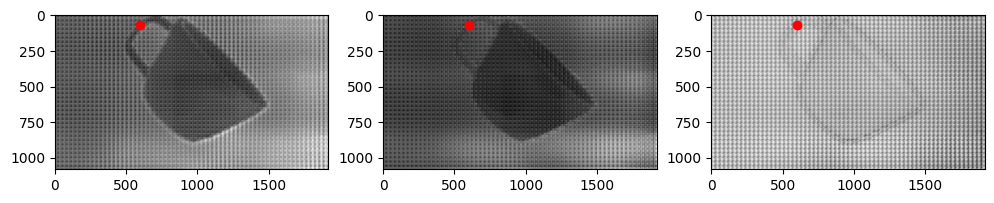

point_id =  3
[840.   67.5]
[840.   67.5]
[840.   67.5]


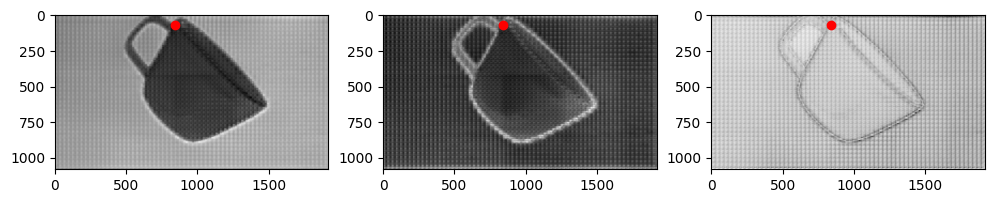

point_id =  10
[600.  202.5]
[600.  202.5]
[600.  202.5]


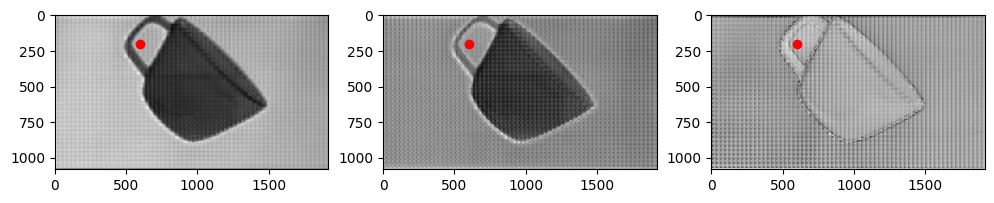

point_id =  21
[1320.   337.5]
[1320.   337.5]
[1320.   337.5]


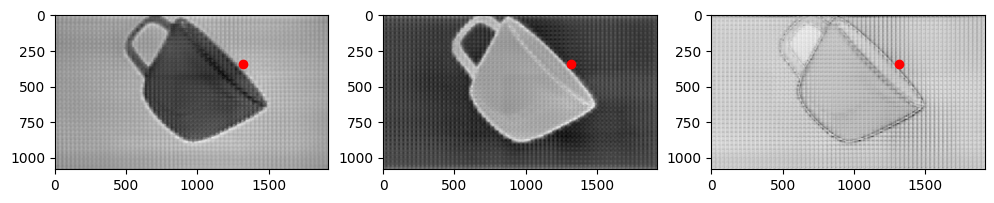

In [ ]:
for i in range(selected_original_res_masks.shape[0]):
    fig = plt.figure(figsize=(12, 3.5))
    point_id = selected_prompt_points[i]
    print("point_id = ", selected_prompt_points[i])
    for mask_id in range(3):
        curr_mask = selected_original_res_masks[i, mask_id, :, :]
        curr_mask_cpu = curr_mask.cpu().detach().numpy()

        prompt_point = all_points[point_id] * np.array((1920, 1080))
        print(prompt_point)

        plt.subplot(1, 3, mask_id+1)
        plt.plot(prompt_point[0], prompt_point[1], marker="o", color='red')
        plt.imshow(curr_mask_cpu, cmap='gray')

    plt.show()

Output by `SamPredictor.predict_torch()`:
1. original resolution masks
2. iou predictions
3. low resolution masks

In [ ]:
print(selected_original_res_masks.shape)
print(selected_iou_predictions.shape)
print(selected_low_res_masks.shape)

torch.Size([4, 3, 1080, 1920])
torch.Size([4, 3])
torch.Size([4, 3, 256, 256])


Serialize predictions and store in MaskData for each prompt

In [ ]:
from segment_anything.utils.amg import (
    MaskData,
    area_from_rle,
    batch_iterator,
    batched_mask_to_box,
    box_xyxy_to_xywh,
    build_all_layer_point_grids,
    calculate_stability_score,
    coco_encode_rle,
    generate_crop_boxes,
    is_box_near_crop_edge,
    mask_to_rle_pytorch,
    remove_small_regions,
    rle_to_mask,
    uncrop_boxes_xyxy,
    uncrop_masks,
    uncrop_points,
)

In [ ]:
print(selected_original_res_masks.shape)
print(selected_iou_predictions.shape)

torch.Size([4, 3, 1080, 1920])
torch.Size([4, 3])


In [ ]:
selected_points = points_for_image[selected_prompt_points]
print(points_for_image.shape)
print(selected_points.shape)

(64, 2)
(4, 2)


In [ ]:
data_all = MaskData(
            masks=selected_original_res_masks.flatten(0, 1), # flattening along dimensions 0 and 1 
            iou_preds=selected_iou_predictions.flatten(0, 1),
            points=torch.as_tensor(selected_points.repeat(3, axis=0)),
        )

## Post Processing

Create data for 0, 10, 27

In [ ]:
print(data_all["masks"].shape)
print(data_all["iou_preds"])

torch.Size([12, 1080, 1920])
tensor([0.7820, 0.4366, 0.5244, 1.0562, 0.6571, 0.3627, 1.2133, 0.9079, 0.3821,
        1.1234, 0.7454, 0.3233], device='cuda:0',
       grad_fn=<ReshapeAliasBackward0>)


### Threshold masks and calculate boxes

In [ ]:
print(mask_generator.predictor.model.mask_threshold)

0.0


In [ ]:
# Threshold masks and calculate boxes
data_all["masks"] = data_all["masks"] > mask_generator.predictor.model.mask_threshold
data_all["boxes"] = batched_mask_to_box(data_all["masks"])

In [ ]:
data_all["rles"] = mask_to_rle_pytorch(data_all["masks"])

In [ ]:
print(data_all["masks"].shape)
print(data_all["iou_preds"])

torch.Size([12, 1080, 1920])
tensor([0.7820, 0.4366, 0.5244, 1.0562, 0.6571, 0.3627, 1.2133, 0.9079, 0.3821,
        1.1234, 0.7454, 0.3233], device='cuda:0',
       grad_fn=<ReshapeAliasBackward0>)


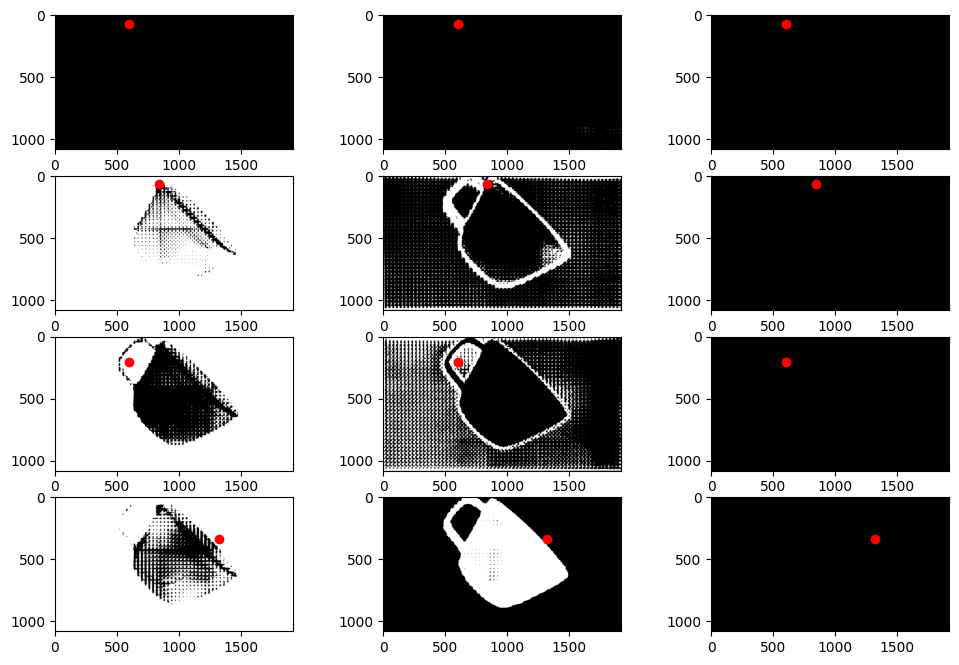

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(12, 8))  # Create a 3x4 subplot grid

for i, ax in enumerate(axes.flatten()):
    if i < data_all["masks"].shape[0]:  # Make sure you don't exceed the number of masks
        curr_mask = data_all["masks"][i, :, :]
        curr_mask_cpu = curr_mask.cpu().detach().numpy()

        prompt_point = data_all["points"][i]
        # print(prompt_point)

        ax.plot(prompt_point[0], prompt_point[1], marker="o", color='red')
        ax.imshow(curr_mask_cpu, cmap='gray')

plt.show()

## Remove small disconnected regions and holes

In [ ]:
print(mask_generator.min_mask_region_area)
print(mask_generator.box_nms_thresh)
print(mask_generator.crop_nms_thresh)

100
0.7
0.7


In [ ]:
mask_data = mask_generator.postprocess_small_regions(
                data_all,
                mask_generator.min_mask_region_area,
                max(mask_generator.box_nms_thresh, mask_generator.crop_nms_thresh),
            )

In [ ]:
# Encode masks
mask_data["segmentations"] = [rle_to_mask(rle) for rle in mask_data["rles"]]

In [ ]:
print(len(mask_data["segmentations"]))

7


In [ ]:
# Final output
print(mask_data["iou_preds"])

tensor([0.7820, 0.5244, 0.3627, 0.3821, 0.3233, 0.4366, 0.7454],
       device='cuda:0', grad_fn=<IndexBackward0>)


Final output of SAM:

In [ ]:
curr_anns = []
for idx in range(len(mask_data["segmentations"])):
    ann = {
        "segmentation": mask_data["segmentations"][idx],
        "area": area_from_rle(mask_data["rles"][idx]),
        "bbox": box_xyxy_to_xywh(mask_data["boxes"][idx]).tolist(),
        "predicted_iou": mask_data["iou_preds"][idx].item(),
        "point_coords": [mask_data["points"][idx].tolist()]
    }
    curr_anns.append(ann)

In [ ]:
print(len(curr_anns))

7


In [ ]:
import matplotlib.patches as patches

[[600.0, 67.5]]
iou_score =  0.7820079922676086
67 600


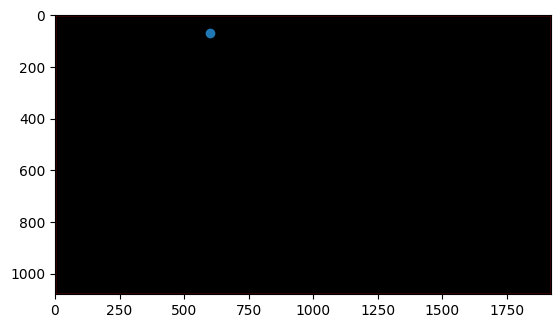

[[600.0, 67.5]]
iou_score =  0.5243735313415527
67 600


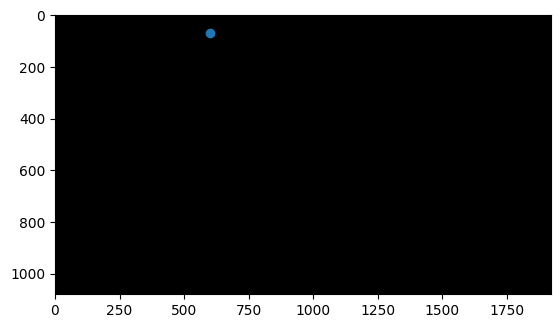

[[840.0, 67.5]]
iou_score =  0.36272960901260376
67 840


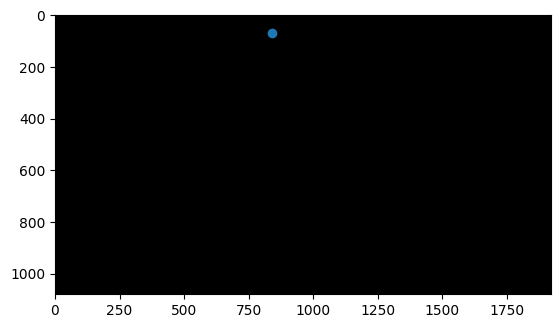

[[600.0, 202.5]]
iou_score =  0.38211822509765625
202 600


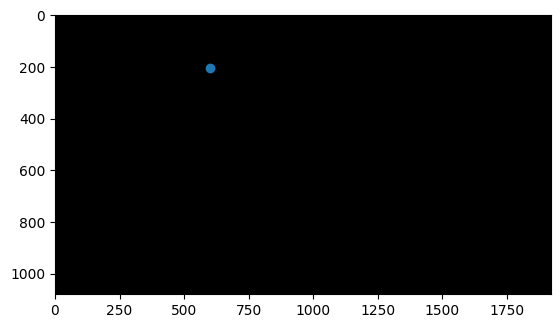

[[1320.0, 337.5]]
iou_score =  0.32331106066703796
337 1320


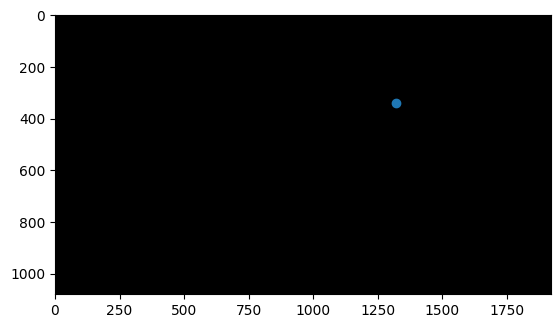

[[600.0, 67.5]]
iou_score =  0.4366028308868408
67 600


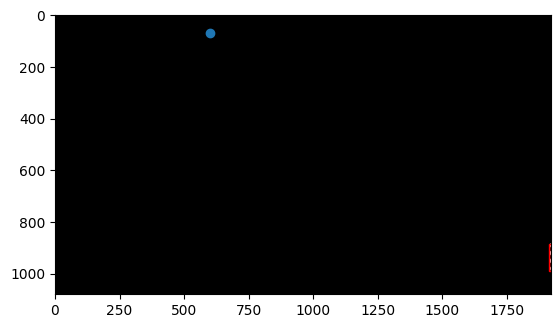

[[1320.0, 337.5]]
iou_score =  0.7454491853713989
337 1320


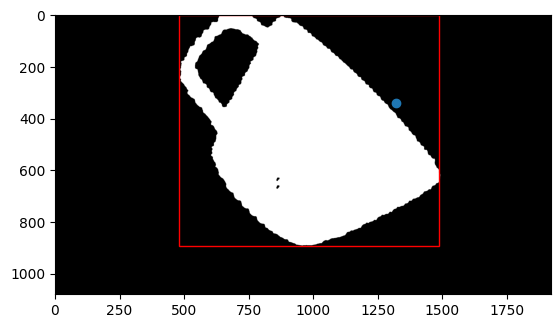

In [ ]:
for mask in curr_anns:
    segmented_mask = mask['segmentation']
    input_points = mask['point_coords']
    print(input_points)
    print("iou_score = ", mask["predicted_iou"])

    bb = mask['bbox']
    rect = patches.Rectangle((bb[0], bb[1]), bb[2], bb[3], linewidth=1, edgecolor='r', facecolor='none')
    
    # values, counts = np.unique(segmented_mask, return_counts=True)
    # print(values)
    # print(counts)
    
    fig, ax = plt.subplots()
    ax.add_patch(rect)

    plt.imshow(segmented_mask, cmap='gray')
    for point in input_points:
        x, y = point[0], point[1]
        print(int(y), int(x))
        plt.plot(x, y, marker="o")
    plt.show()

